# **Modelagem (Modeling)**

Equipe:
* Beatriz Andrade de Miranda - bam2@cin.ufpe.br
* Camila Siqueira Lins - csl2@cin.ufpe.br
* Luisa Cavalcante - lncc@cin.ufpe.br
* Nicolly Lira Albuquerque - nla@cin.ufpe.br


# **Sumário**

* [0. Importação de bibliotecas e definição de funções](#scrollTo=PM20gyIM4KFr)
* [1. Carregamento da base](#scrollTo=eW8NtvO04V2h)
* [2. Algoritmos](#scrollTo=8RdHWPAS5FIL)
  * [2.1. K-NN](#scrollTo=XhFY2Kmf5G-j)
  * [2.2. LVQ (Learning Vector Quantization)](#scrollTo=2XMhOnu65M6a)
  * [2.3. Árvore de Decisão](#scrollTo=iab2GzV05KIq)
  * [2.4. SVM (Support Vector Machine)](#scrollTo=t3c6hFNb5UV1)
  * [2.5. Random Forest](#scrollTo=R79jLyyrWsJ0)
  * [2.6. Rede Neural MLP (Multilayer Perceptron)](#scrollTo=F_sDwcTf5X3F)
  * [2.7. Comitê de Redes Neurais Artificiais](#scrollTo=SEYDXpjniF5w)
  * [2.8. Comitê Heterogêneo (Stacking)](#scrollTo=t1WJCIPSiO7r)
  * [2.9. XGBoost](#scrollTo=UYVSf9d0igV9)
  * [2.10. LightGBM](#scrollTo=l1l_PhOZimcP)
* [3. Comparação dos resultados dos algoritmos](#scrollTo=9Id5gRzHy3I4)
  * [3.1. Kolmogorov-Smirnov](#scrollTo=V1Ys09Rp6EoW)
  * [3.2. Friedmann](#scrollTo=fT1mFhW5t9qT)
  * [3.3. Nemenyi](#scrollTo=3ur4_oUMqhSt)
* [4. Melhor Modelo](#scrollTo=NdoNnAaeldCO)

#0. Importação de bibliotecas e definição de funções

**Import de bibliotecas**

In [1]:
!pip install memory-profiler


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
!pip install imbalanced-learn



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
!pip install gdown


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
!pip install scikit_posthocs


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
!pip install sklvq


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
!pip install optuna



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [17]:
!pip install lightgbm

   ---------------------------------------- 0.0/1.4 MB ? eta -:--:--
    --------------------------------------- 0.0/1.4 MB 1.4 MB/s eta 0:00:02
   - -------------------------------------- 0.1/1.4 MB 787.7 kB/s eta 0:00:02
   ---- ----------------------------------- 0.2/1.4 MB 1.1 MB/s eta 0:00:02
   ------- -------------------------------- 0.3/1.4 MB 1.5 MB/s eta 0:00:01
   -------------- ------------------------- 0.5/1.4 MB 2.3 MB/s eta 0:00:01
   ------------------- -------------------- 0.7/1.4 MB 2.6 MB/s eta 0:00:01
   ------------------------------ --------- 1.1/1.4 MB 3.5 MB/s eta 0:00:01
   ---------------------------------------  1.4/1.4 MB 4.4 MB/s eta 0:00:01
   ---------------------------------------- 1.4/1.4 MB 3.8 MB/s eta 0:00:00



[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
!pip install xgboost

   ---------------------------------------- 0.0/124.9 MB ? eta -:--:--
   ---------------------------------------- 0.0/124.9 MB 1.3 MB/s eta 0:01:38
   ---------------------------------------- 0.1/124.9 MB 1.1 MB/s eta 0:01:55
   ---------------------------------------- 0.2/124.9 MB 1.3 MB/s eta 0:01:36
   ---------------------------------------- 0.3/124.9 MB 1.7 MB/s eta 0:01:12
   ---------------------------------------- 0.6/124.9 MB 2.5 MB/s eta 0:00:50
   ---------------------------------------- 1.0/124.9 MB 3.7 MB/s eta 0:00:34
   ---------------------------------------- 1.2/124.9 MB 3.3 MB/s eta 0:00:38
    --------------------------------------- 2.1/124.9 MB 5.5 MB/s eta 0:00:23
    --------------------------------------- 2.7/124.9 MB 6.4 MB/s eta 0:00:20
   - -------------------------------------- 3.2/124.9 MB 6.9 MB/s eta 0:00:18
   - -------------------------------------- 5.2/124.9 MB 10.1 MB/s eta 0:00:12
   - -------------------------------------- 5.2/124.9 MB 10.1 MB/s eta


[notice] A new release of pip is available: 24.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
#Base de dados
import numpy as np
import pandas as pd
import gdown

# Pré-processamento
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import ADASYN


#Algorítmos para criação de modelos
from sklearn.svm import SVC
from sklvq import GLVQ
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
#encoding
from sklearn.preprocessing import LabelEncoder

#Otimização
#from sklearn.model_selection import GridSearchcv
from sklearn.model_selection import KFold
import optuna


#Métricas de avaliação
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score, roc_auc_score, f1_score, precision_score, recall_score, classification_report, make_scorer, confusion_matrix, ConfusionMatrixDisplay, roc_curve, auc

#Testes estatísticos
from scipy.stats import kstest
from scipy.stats import friedmanchisquare
from scipy.stats import rankdata
from itertools import combinations

#Gráficos
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import RandomizedSearchCV, KFold
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import make_scorer, accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
import numpy as np

#outros
import time
import psutil
import os
import timeit
from memory_profiler import memory_usage


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


**Funções**

In [19]:

def get_acsa(y_test_fold,y_pred_fold):
        # Matriz de Confusão
        cm = confusion_matrix(y_test_fold, y_pred_fold)
        num_classes = cm.shape[0]  # Número de classes
        acsa = 0
        for i in range(num_classes):
            tp = cm[i, i]
            fn = np.sum(cm[i, :]) - tp
            acsa += tp / (tp + fn)  # Acurácia para a classe i
        acsa = acsa / num_classes  # Média das acurácias das classes
        return acsa


In [20]:
def rank_and_select_best(df, metric_columns):

    # Calcula os rankings para cada métrica (maior valor = melhor rank)
    ranked_metrics = df[metric_columns].rank(ascending=False, axis=0)

    # Calcula a média dos rankings para cada linha
    df['mean_rank'] = ranked_metrics.mean(axis=1)

    # Seleciona a linha com a maior média dos rankings
    best_row = df.loc[df['mean_rank'].idxmin()]

    return best_row, df[['mean_rank'] + metric_columns]  # Retorna a linha e a tabela de rankings

In [21]:
def plot_roc_curve(model, X_test, y_test, model_name="Modelo"):
    """
    Função para plotar a curva ROC de modelos.

    Parâmetros:
    - model: modelo treinado que implemente `predict_proba`.
    - X_test: conjunto de dados de teste.
    - y_test: rótulos reais do conjunto de teste.
    - model_name: string com o nome do modelo ou configuração (opcional).
    """
    # Gerar probabilidades preditas
    y_pred_proba = model.predict_proba(X_test)

    # Verificar número de classes para calcular o ROC adequadamente
    n_classes = y_pred_proba.shape[1]

    # Calcular curva ROC para cada classe
    fpr = {}
    tpr = {}
    roc_auc = {}
    for i in range(n_classes):
        fpr[i], tpr[i], _ = roc_curve(y_test == i, y_pred_proba[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Plotar a curva ROC
    plt.figure(figsize=(10, 8))
    for i in range(n_classes):
        plt.plot(fpr[i], tpr[i], label=f'Classe {i} (AUC = {roc_auc[i]:.2f})')

    # Linha de referência
    plt.plot([0, 1], [0, 1], 'k--', lw=2)

    # Configurar gráfico
    plt.title(f'Curva ROC - {model_name}', fontsize=16)
    plt.xlabel('Taxa de Falsos Positivos (FPR)', fontsize=14)
    plt.ylabel('Taxa de Verdadeiros Positivos (TPR)', fontsize=14)
    plt.legend(loc='lower right', fontsize=12)
    plt.grid()
    plt.show()

#1. Carregamento da base

**Conjuntos de treino, teste e validação**

In [ ]:
'''
def read_from_drive(files_ids):
  # Criar uma lista de nomes de arquivos para salvar
  file_names = [f'file_{i}.csv' for i in range(len(file_ids))]

  # Criar uma lista para armazenar os DataFrames
  dataframes = []

  # Baixar e ler cada arquivo
  for file_id, file_name in zip(file_ids, file_names):
      # Baixar o arquivo
      gdown.download(f'https://drive.google.com/uc?id={file_id}', output=file_name, quiet=False)

      # Ler o arquivo CSV e adicionar ao DataFrame
      df = pd.read_csv(file_name, index_col=False)
      dataframes.append(df)

  return dataframes
'''

In [23]:
'''
file_ids = [
    '1gQ2y0hoh2KDH0SSVnDuVsYW2fxLaoKDB',  # train
    '1xAsVxgi3kbC9a_OOjfORcZhlwFk555SW', #test
    '1rLXZeiKb_3CarXcwSnB-c863-L4thkUM' #validation
]

dataframes = read_from_drive(file_ids)
df_train = dataframes[0]
df_test = dataframes[1]
df_valid = dataframes[2]
'''
df_train =pd.read_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\df_train_final.csv')
df_test = pd.read_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\df_test_final.csv')
df_valid = pd.read_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\df_val_final.csv')

In [24]:
df_train.head()

,Rad Flow,Fpv Close,Fpv Open,High,Bypass,Bpv Close,Bpv Open,class
0,0.358974,0.018817,0.762712,0.409524,0.108108,0.201835,0.342857,Bpv Close
1,0.076923,0.018817,0.559322,0.409524,0.175676,0.321101,0.414286,Bpv Close
2,0.153846,0.018817,0.677966,0.409524,0.297297,0.220183,0.271429,Bpv Close
3,0.025641,0.010753,0.627119,0.657143,0.256757,0.220183,0.285714,Bpv Close
4,0.820513,0.008065,0.694915,0.419048,0.189189,0.431193,0.485714,Bpv Close


In [25]:
df_test.head()

,Rad Flow,Fpv Close,Fpv Open,High,Bypass,Bpv Close,Bpv Open,class
0,0.128205,0.918782,0.745763,0.621951,0.558824,0.154545,0.000000,Rad Flow
1,0.128205,0.918782,0.457627,0.512195,0.602941,0.454545,0.222222,Rad Flow
2,0.076923,0.918782,0.525424,0.341463,0.573529,0.363636,0.174603,Rad Flow
3,0.051282,0.918782,0.644068,0.219512,0.573529,0.218182,0.047619,Rad Flow
4,0.128205,0.918782,0.389831,0.365854,0.602941,0.527273,0.285714,Rad Flow


In [26]:
df_valid.head()

,Rad Flow,Fpv Close,Fpv Open,High,Bypass,Bpv Close,Bpv Open,class
0,0.179487,0.928571,0.559322,0.367347,0.632353,0.351852,0.126984,Rad Flow
1,0.128205,0.928571,0.762712,0.244898,0.485294,0.120370,0.015873,Rad Flow
2,0.051282,0.928571,0.627119,0.316327,0.573529,0.240741,0.063492,Rad Flow
3,0.589744,0.928571,0.830508,0.183673,0.588235,0.212963,0.031746,High
4,0.153846,0.928571,0.491525,0.683673,0.617647,0.416667,0.190476,Rad Flow


In [27]:
df_train['class'] = df_train['class'].replace({'Rad Flow':1,'Fpv Close':2,'Fpv Open':3, 'High':4,'Bypass':5,'Bpv Close':6,'Bpv Open':7} )
df_test['class'] = df_test['class'].replace({'Rad Flow':1,'Fpv Close':2,'Fpv Open':3, 'High':4,'Bypass':5,'Bpv Close':6,'Bpv Open':7} )
df_valid['class'] = df_valid['class'].replace({'Rad Flow':1,'Fpv Close':2,'Fpv Open':3, 'High':4,'Bypass':5,'Bpv Close':6,'Bpv Open':7} )

In [28]:
X_train = df_train.drop('class', axis=1)
y_train = df_train['class']

X_test = df_test.drop('class', axis=1)
y_test = df_test['class']

X_valid = df_valid.drop('class', axis=1)
y_valid = df_valid['class']

In [29]:
print(len(X_train))
print(len(y_train))
print(len(X_test))
print(len(y_test))
print(len(X_valid))
print(len(y_valid))

7718
7718
4845
4845
4844
4844


In [30]:
print(y_valid.head())

0    1
1    1
2    1
3    4
4    1
Name: class, dtype: int64


In [31]:
kf = KFold(n_splits=10, shuffle=True, random_state=42)

#2. Algoritmos

## 2.1. K-NN

fine tuning sem optuna

In [149]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
import numpy as np
import pandas as pd
import random

# Definindo o espaço de busca para os hiperparâmetros
n_neighbors_range = range(5, 50)  # valores de k de 5 a 49
metrics = ["euclidean", "manhattan"]  # métricas de distância

# Número de combinações aleatórias a serem testadas
n_iter = 20

# Gerando combinações aleatórias de parâmetros
random_combinations = []
for _ in range(n_iter):
    params = {
        'n_neighbors': random.choice(n_neighbors_range),
        'metric': random.choice(metrics)
    }
    random_combinations.append(params)
print(random_combinations)
# Configurando validação cruzada com 10 folds
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lista para armazenar os resultados
results = []

# Loop sobre as combinações aleatórias
for params in random_combinations:
    k = params['n_neighbors']
    metric = params['metric']
    print(f"Treinando para k={k} e métrica de distância {metric}")

    fold_results = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}

    # Validação cruzada
    for train_index, test_index in kf.split(X_train):
        X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
        y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]

        # Treinamento do modelo
        knn = KNeighborsClassifier(n_neighbors=k, metric=metric)
        knn.fit(X_train_fold, y_train_fold)

        # Previsões e cálculo de métricas para cada fold
        y_pred_fold = knn.predict(X_test_fold)
        fold_results['accuracy'].append(accuracy_score(y_test_fold, y_pred_fold))
        fold_results['recall'].append(recall_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['precision'].append(precision_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['f1'].append(f1_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['acsa'].append(get_acsa(y_test_fold, y_pred_fold))

        try:
            fold_results['roc_auc'].append(
                roc_auc_score(y_test_fold, knn.predict_proba(X_test_fold), multi_class='ovr')
            )
        except ValueError:
            fold_results['roc_auc'].append(np.nan)

    # Armazenando os resultados para a combinação de parâmetros atual
    results.append({
        'n_neighbors': k,
        'metric': metric,
        'accuracy': np.mean(fold_results['accuracy']),
        'recall': np.mean(fold_results['recall']),
        'precision': np.mean(fold_results['precision']),
        'f1': np.mean(fold_results['f1']),
        'roc_auc': np.nanmean(fold_results['roc_auc']),  # Calcula média ignorando NaN
        'acsa': np.mean(fold_results['acsa'])  # Calcula média ignorando NaN
    })

# Convertendo os resultados para um DataFrame
results_knn = pd.DataFrame(results)

# Exibindo as 5 melhores combinações de parâmetros
print(results_knn.sort_values(by='accuracy', ascending=False).head(5))


[{'n_neighbors': 24, 'metric': 'euclidean'}, {'n_neighbors': 44, 'metric': 'euclidean'}, {'n_neighbors': 15, 'metric': 'manhattan'}, {'n_neighbors': 29, 'metric': 'euclidean'}, {'n_neighbors': 22, 'metric': 'manhattan'}, {'n_neighbors': 5, 'metric': 'euclidean'}, {'n_neighbors': 29, 'metric': 'euclidean'}, {'n_neighbors': 39, 'metric': 'euclidean'}, {'n_neighbors': 16, 'metric': 'manhattan'}, {'n_neighbors': 46, 'metric': 'manhattan'}, {'n_neighbors': 25, 'metric': 'manhattan'}, {'n_neighbors': 30, 'metric': 'manhattan'}, {'n_neighbors': 47, 'metric': 'euclidean'}, {'n_neighbors': 19, 'metric': 'euclidean'}, {'n_neighbors': 43, 'metric': 'manhattan'}, {'n_neighbors': 33, 'metric': 'euclidean'}, {'n_neighbors': 16, 'metric': 'euclidean'}, {'n_neighbors': 39, 'metric': 'manhattan'}, {'n_neighbors': 32, 'metric': 'manhattan'}, {'n_neighbors': 25, 'metric': 'euclidean'}]
Treinando para k=24 e métrica de distância euclidean
Treinando para k=44 e métrica de distância euclidean
Treinando para

In [150]:
results_knn.to_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_knn.csv', index= False)

fine tuning com optuna

In [151]:

def objective(trial):
    # Sugerindo valores de hiperparâmetros
    n_neighbors = trial.suggest_int('n_neighbors', 5, 50)  # Número de vizinhos de 5 a 50
    metric = trial.suggest_categorical('metric', ['euclidean', 'manhattan'])  # Métricas de distância

    # Inicializando o classificador KNN com os parâmetros sugeridos
    knn = KNeighborsClassifier(n_neighbors=n_neighbors, metric=metric)

    # Validação cruzada com KFold
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    accuracy_scores = []

    # Corrigindo o uso de índices durante a validação cruzada
    for train_index, test_index in kf.split(X_train):
        X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
        y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]

        # Treinando o modelo
        knn.fit(X_train_fold, y_train_fold)

        # Fazendo previsões e calculando a acurácia
        y_pred_fold = knn.predict(X_test_fold)
        accuracy = accuracy_score(y_test_fold, y_pred_fold)
        accuracy_scores.append(accuracy)

    # Retornando a média da acurácia para otimização
    return np.mean(accuracy_scores)

In [152]:

# Definindo o estudo de otimização com Optuna
study = optuna.create_study(direction='maximize')  # Maximizar a acurácia
study.optimize(objective, n_trials=20)  # Realiza 20 tentativas de otimização

# Exibindo os melhores parâmetros encontrados
print(f"Melhores parâmetros: {study.best_params}")
print(f"Melhor valor de acurácia: {study.best_value}")

# Treinando o modelo final com os melhores parâmetros encontrados
best_params = study.best_params


[I 2024-12-01 11:18:31,198] A new study created in memory with name: no-name-a426c8a5-6e7d-4159-a076-07b74b404d48
[I 2024-12-01 11:18:31,730] Trial 0 finished with value: 0.9280904954873221 and parameters: {'n_neighbors': 42, 'metric': 'euclidean'}. Best is trial 0 with value: 0.9280904954873221.
[I 2024-12-01 11:18:32,170] Trial 1 finished with value: 0.9359925539135636 and parameters: {'n_neighbors': 40, 'metric': 'manhattan'}. Best is trial 1 with value: 0.9359925539135636.
[I 2024-12-01 11:18:32,595] Trial 2 finished with value: 0.9299044710120091 and parameters: {'n_neighbors': 40, 'metric': 'euclidean'}. Best is trial 1 with value: 0.9359925539135636.
[I 2024-12-01 11:18:32,960] Trial 3 finished with value: 0.964108586520433 and parameters: {'n_neighbors': 11, 'metric': 'euclidean'}. Best is trial 3 with value: 0.964108586520433.
[I 2024-12-01 11:18:33,442] Trial 4 finished with value: 0.9598324630551802 and parameters: {'n_neighbors': 15, 'metric': 'euclidean'}. Best is trial 3 

Melhores parâmetros: {'n_neighbors': 5, 'metric': 'euclidean'}
Melhor valor de acurácia: 0.9761594188289214


In [153]:
print(best_params)

{'n_neighbors': 5, 'metric': 'euclidean'}


**Melhor modelo**

In [154]:
knn_best_model = KNeighborsClassifier(n_neighbors=best_params['n_neighbors'], metric=best_params['metric'])
knn_best_model.fit(X_train, y_train)


KNeighborsClassifier(metric='euclidean')

In [155]:
start_time_knn = timeit.default_timer()
y_pred_best = knn_best_model.predict(X_test)
infer_time_knn = timeit.default_timer() - start_time_knn
print(infer_time_knn)

0.19416220003040507


In [156]:
results_knn = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': []}

In [157]:
results_knn['accuracy'] = accuracy_score(y_test, y_pred_best)
results_knn['recall']=recall_score(y_test, y_pred_best, average='macro')
results_knn['precision']=precision_score(y_test, y_pred_best, average='macro')
results_knn['f1']=f1_score(y_test, y_pred_best, average='macro')
results_knn['roc_auc'] = roc_auc_score(y_test, knn_best_model.predict_proba(X_test), multi_class='ovr')
results_knn['acsa']   = get_acsa(y_test,y_pred_best)

c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [158]:
print(results_knn)

{'accuracy': 0.291640866873065, 'recall': 0.39713466806340963, 'precision': 0.45128077644643483, 'f1': 0.2829583462998205, 'roc_auc': 0.7125119771208096, 'acsa': 0.39713466806340963}


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


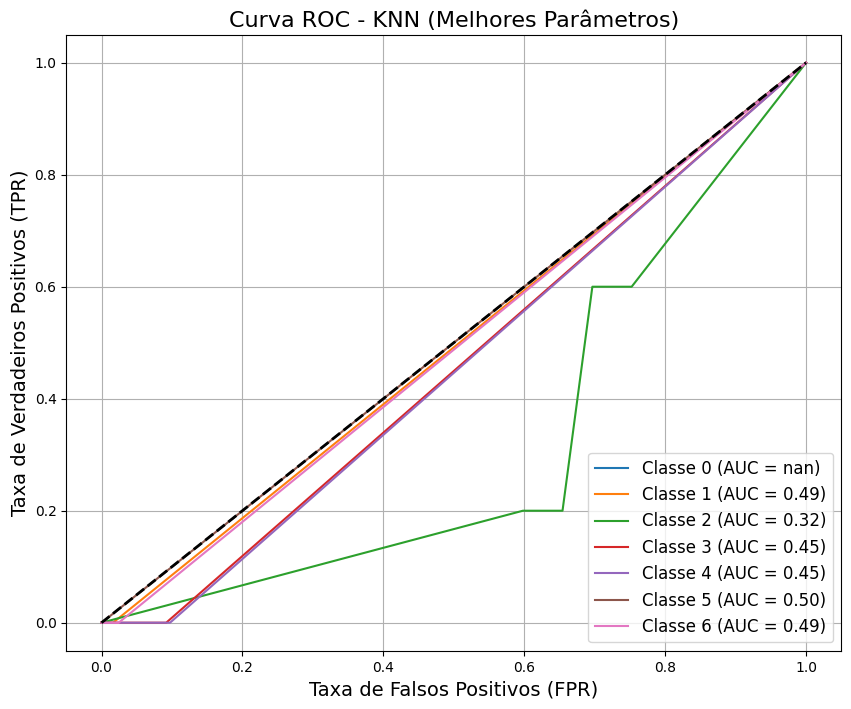

In [78]:
plot_roc_curve(knn_best_model, X_test, y_test, model_name="KNN (Melhores Parâmetros)")

## 2.2. LVQ (Learning Vector Quantization)


**Parametrização**

In [92]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
import numpy as np
import pandas as pd
import random

distance_type=['squared-euclidean', 'euclidean']
solver_type= ['steepest-gradient-descent', 'adam']
solver_params = [
    {'max_runs': 10, 'step_size': 0.5},
    {'max_runs': 20, 'step_size': 0.1},
    {'max_runs': 50, 'step_size': 0.01},
    {'max_runs': 10, 'step_size': 0.2},
    {'max_runs': 30, 'step_size': 0.05},
]

n_iter = 20

# Gerando combinações aleatórias de parâmetros
random_combinations = []
for _ in range(n_iter):
    params = {
        'distance_type': random.choice(distance_type),
        'solver_type': random.choice(solver_type),
        'solver_params': random.choice(solver_params)
    }
    random_combinations.append(params)
print(random_combinations)
# Configurando validação cruzada com 10 folds
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lista para armazenar os resultados
results = []

# Loop sobre as combinações aleatórias
for params in random_combinations:
    distance_type = params['distance_type']
    solver_type = params['solver_type']
    solver_params = params['solver_params']
    print(f"Treinando para distance_type={distance_type}, solver_type {solver_type}, solver_params {solver_params} ")

    fold_results = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}

    # Validação cruzada
    for train_index, test_index in kf.split(X_train):
        X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
        y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]
        model_params = {
                            'distance_type': distance_type,
                            'activation_type': 'identity',
                            'solver_type': solver_type,
                            'solver_params': solver_params
                        }
        # Treinamento do modelo
        glvq = GLVQ(**model_params)
        glvq.fit(X_train_fold, y_train_fold.values.ravel())


        # Previsões e cálculo de métricas para cada fold
        y_pred_fold = glvq.predict(X_test_fold)

        fold_results['accuracy'].append(accuracy_score(y_test_fold, y_pred_fold))
        fold_results['recall'].append(recall_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['precision'].append(precision_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['f1'].append(f1_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['acsa'].append(get_acsa(y_test_fold, y_pred_fold))
        try:
            fold_results['roc_auc'].append(
                roc_auc_score(y_test_fold, glvq.predict_proba(X_test_fold), multi_class='ovr')
            )
        except ValueError:
            fold_results['roc_auc'].append(np.nan)

    # Armazenando os resultados para a combinação de parâmetros atual
    results.append({
        'distance_type': distance_type,
        'activation_type': 'identity',
        'solver_type': solver_type,
        'solver_params': solver_params,

        'accuracy': np.mean(fold_results['accuracy']),
        'recall': np.mean(fold_results['recall']),
        'precision': np.mean(fold_results['precision']),
        'f1': np.mean(fold_results['f1']),
        'roc_auc': np.mean(fold_results['roc_auc']),  # Calcula média ignorando NaN
        'acsa': np.mean(fold_results['acsa'])  # Calcula média ignorando NaN

    })

results_glvq = pd.DataFrame(results)
print(results_glvq.sort_values(by='accuracy', ascending=False).head(5))

[{'distance_type': 'euclidean', 'solver_type': 'steepest-gradient-descent', 'solver_params': {'max_runs': 20, 'step_size': 0.1}}, {'distance_type': 'euclidean', 'solver_type': 'adam', 'solver_params': {'max_runs': 30, 'step_size': 0.05}}, {'distance_type': 'euclidean', 'solver_type': 'steepest-gradient-descent', 'solver_params': {'max_runs': 30, 'step_size': 0.05}}, {'distance_type': 'euclidean', 'solver_type': 'adam', 'solver_params': {'max_runs': 20, 'step_size': 0.1}}, {'distance_type': 'squared-euclidean', 'solver_type': 'steepest-gradient-descent', 'solver_params': {'max_runs': 20, 'step_size': 0.1}}, {'distance_type': 'squared-euclidean', 'solver_type': 'adam', 'solver_params': {'max_runs': 10, 'step_size': 0.5}}, {'distance_type': 'squared-euclidean', 'solver_type': 'steepest-gradient-descent', 'solver_params': {'max_runs': 20, 'step_size': 0.1}}, {'distance_type': 'euclidean', 'solver_type': 'adam', 'solver_params': {'max_runs': 50, 'step_size': 0.01}}, {'distance_type': 'squar

c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

Treinando para distance_type=euclidean, solver_type steepest-gradient-descent, solver_params {'max_runs': 30, 'step_size': 0.05} 
Treinando para distance_type=euclidean, solver_type adam, solver_params {'max_runs': 20, 'step_size': 0.1} 


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

Treinando para distance_type=squared-euclidean, solver_type steepest-gradient-descent, solver_params {'max_runs': 20, 'step_size': 0.1} 


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Treinando para distance_type=squared-euclidean, solver_type adam, solver_params {'max_runs': 10, 'step_size': 0.5} 


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

Treinando para distance_type=squared-euclidean, solver_type steepest-gradient-descent, solver_params {'max_runs': 20, 'step_size': 0.1} 
Treinando para distance_type=euclidean, solver_type adam, solver_params {'max_runs': 50, 'step_size': 0.01} 
Treinando para distance_type=squared-euclidean, solver_type adam, solver_params {'max_runs': 20, 'step_size': 0.1} 


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

Treinando para distance_type=squared-euclidean, solver_type steepest-gradient-descent, solver_params {'max_runs': 20, 'step_size': 0.1} 


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Treinando para distance_type=euclidean, solver_type steepest-gradient-descent, solver_params {'max_runs': 30, 'step_size': 0.05} 
Treinando para distance_type=squared-euclidean, solver_type steepest-gradient-descent, solver_params {'max_runs': 30, 'step_size': 0.05} 
Treinando para distance_type=squared-euclidean, solver_type steepest-gradient-descent, solver_params {'max_runs': 20, 'step_size': 0.1} 


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Treinando para distance_type=euclidean, solver_type steepest-gradient-descent, solver_params {'max_runs': 10, 'step_size': 0.2} 


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Treinando para distance_type=squared-euclidean, solver_type adam, solver_params {'max_runs': 10, 'step_size': 0.5} 


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

Treinando para distance_type=euclidean, solver_type adam, solver_params {'max_runs': 30, 'step_size': 0.05} 


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

Treinando para distance_type=euclidean, solver_type adam, solver_params {'max_runs': 20, 'step_size': 0.1} 


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

Treinando para distance_type=euclidean, solver_type adam, solver_params {'max_runs': 10, 'step_size': 0.5} 


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

Treinando para distance_type=squared-euclidean, solver_type adam, solver_params {'max_runs': 10, 'step_size': 0.2} 


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

Treinando para distance_type=squared-euclidean, solver_type adam, solver_params {'max_runs': 10, 'step_size': 0.2} 


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

        distance_type activation_type                solver_type  \
2           euclidean        identity  steepest-gradient-descent   
11  squared-euclidean        identity  steepest-gradient-descent   
10          euclidean        identity  steepest-gradient-descent   
0           euclidean        identity  steepest-gradient-descent   
7           euclidean        identity                       adam   

                          solver_params  accuracy    recall  precision  \
2   {'max_runs': 30, 'step_size': 0.05}  0.569573  0.569062   0.613622   
11  {'max_runs': 30, 'step_size': 0.05}  0.549095  0.549104   0.611918   
10  {'max_runs': 30, 'step_size': 0.05}  0.540282  0.538655   0.587194   
0    {'max_runs': 20, 'step_size': 0.1}  0.537826  0.539250   0.565195   
7   {'max_runs': 50, 'step_size': 0.01}  0.530708  0.531937   0.553609   

          f1   roc_auc      acsa  
2   0.529621  0.815091  0.569062  
11  0.509769  0.782383  0.549104  
10  0.503686  0.809058  0.538655  
0   0.

In [93]:
results_glvq.to_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_lqv.csv', index= False)

**Resultado da Modelagem**

In [94]:
metrics = ["precision", "accuracy", "recall", "f1", "roc_auc","acsa"]
best_row, rankings = rank_and_select_best(results_glvq, metrics)
best_row

distance_type                                euclidean
activation_type                               identity
solver_type                  steepest-gradient-descent
solver_params      {'max_runs': 30, 'step_size': 0.05}
accuracy                                      0.569573
recall                                        0.569062
precision                                     0.613622
f1                                            0.529621
roc_auc                                       0.815091
acsa                                          0.569062
mean_rank                                     1.666667
Name: 2, dtype: object

**Melhor modelo**

In [96]:
best_row['solver_params']

{'max_runs': 30, 'step_size': 0.05}

In [97]:
model_params = {
                            'distance_type': best_row['distance_type'],
                            'activation_type': best_row['activation_type'],
                            'solver_type': best_row['solver_type'],
                            'solver_params': best_row['solver_params']
                        }

best_glvq_model = GLVQ(**model_params)

In [98]:
best_glvq_model.fit(X_train, y_train.values.ravel())

GLVQ(activation_type='identity', distance_type='euclidean',
     solver_params={'max_runs': 30, 'step_size': 0.05})

In [99]:
start_time_glqv= timeit.default_timer()
y_best_pred = best_glvq_model.predict(X_test)
infer_time_glqv = timeit.default_timer() - start_time_glqv
print(infer_time_glqv)

0.023922399966977537


In [100]:
val_accuracy = accuracy_score(y_test, y_best_pred)
print(f"Acurácia no conjunto de teste: {val_accuracy:.4f}")
print("Desempenho no Conjunto de teste:\n")
print(classification_report(y_test, y_best_pred, zero_division=1))

Acurácia no conjunto de teste: 0.5901
Desempenho no Conjunto de teste:

              precision    recall  f1-score   support

           1       0.85      0.66      0.74      3498
           2       0.01      0.20      0.01         5
           3       0.04      0.27      0.07        30
           4       0.92      0.30      0.45       927
           5       0.99      0.69      0.81       381
           6       0.00      0.00      1.00         1
           7       0.00      0.00      1.00         3

    accuracy                           0.59      4845
   macro avg       0.40      0.30      0.58      4845
weighted avg       0.87      0.59      0.69      4845



In [101]:
results_lqv_best = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}

In [102]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Matriz de Confusão
conf_matrix = confusion_matrix(y_test, y_best_pred)

# Calcular ACSA
class_accuracy = conf_matrix.diagonal() / conf_matrix.sum(axis=1)
acsa = np.mean(class_accuracy)

results_lqv_best['acsa'] = acsa


In [103]:
results_lqv_best['accuracy'] = accuracy_score(y_test, y_best_pred)
results_lqv_best['recall']=recall_score(y_test, y_best_pred, average='macro')
results_lqv_best['precision']=precision_score(y_test, y_best_pred, average='macro')
results_lqv_best['f1']=f1_score(y_test, y_best_pred, average='macro')
results_lqv_best['roc_auc'] = roc_auc_score(y_test, best_glvq_model.predict_proba(X_test), multi_class='ovr')

In [104]:
print(results_lqv_best)

{'accuracy': 0.590092879256966, 'recall': 0.30163267260829185, 'precision': 0.40200362729259836, 'f1': 0.2984537737878493, 'roc_auc': 0.7166183794921392, 'acsa': 0.30163267260829185}


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


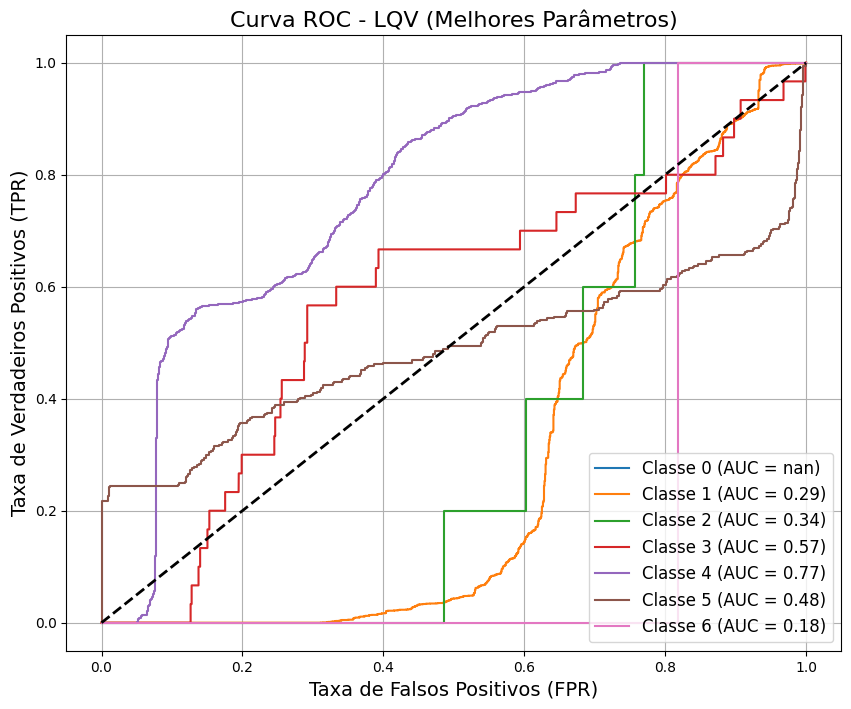

In [105]:
plot_roc_curve(best_glvq_model, X_test, y_test, model_name="LQV (Melhores Parâmetros)")

## 2.3. Árvore de Decisão


fine tuning sem optuna

In [106]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
import numpy as np
import pandas as pd
import random

# Definindo o espaço de busca para os hiperparâmetros
max_depth = [3, 10, 20, 30, 40, 50]
min_samples_split = [2, 5, 10, 15]
min_samples_leaf=[1, 2, 5, 10]
criterion = ['gini', 'entropy']

# Número de combinações aleatórias a serem testadas
n_iter = 20

# Gerando combinações aleatórias de parâmetros
random_combinations = []
for _ in range(n_iter):
    params = {
        'max_depth': random.choice(max_depth),
        'min_samples_split': random.choice(min_samples_split),
        'min_samples_leaf': random.choice(min_samples_leaf),
        'criterion': random.choice(criterion)
    }
    random_combinations.append(params)
print(random_combinations)
# Configurando validação cruzada com 10 folds
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lista para armazenar os resultados
results = []

# Loop sobre as combinações aleatórias
for params in random_combinations:
    max_depth = params['max_depth']
    min_samples_split = params['min_samples_split']
    min_samples_leaf = params['min_samples_leaf']
    criterion = params['criterion']
    print(f"Treinando para max_depth={max_depth}, min_samples_split {min_samples_split}, min_samples_leaf {min_samples_leaf} e criterion {criterion}")

    fold_results = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}

    # Validação cruzada
    for train_index, test_index in kf.split(X_train):
        X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
        y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]

        # Treinamento do modelo
        dt = DecisionTreeClassifier(
                        max_depth=max_depth,
                        min_samples_split=min_samples_split,
                        min_samples_leaf=min_samples_leaf,
                        criterion=criterion,
                        random_state=42
                    )
        dt.fit(X_train_fold, y_train_fold)

        # Previsões e cálculo de métricas para cada fold
        y_pred_fold = dt.predict(X_test_fold)
        fold_results['accuracy'].append(accuracy_score(y_test_fold, y_pred_fold))
        fold_results['recall'].append(recall_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['precision'].append(precision_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['f1'].append(f1_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['acsa'].append(get_acsa(y_test_fold, y_pred_fold))

        try:
            fold_results['roc_auc'].append(
                roc_auc_score(y_test_fold, dt.predict_proba(X_test_fold), multi_class='ovr')
            )
        except ValueError:
            fold_results['roc_auc'].append(np.nan)

    # Armazenando os resultados para a combinação de parâmetros atual
    results.append({
        'max_depth': max_depth,
        'min_samples_split': min_samples_split,
        'min_samples_leaf': min_samples_leaf,
        'criterion': criterion,

        'accuracy': np.mean(fold_results['accuracy']),
        'recall': np.mean(fold_results['recall']),
        'precision': np.mean(fold_results['precision']),
        'f1': np.mean(fold_results['f1']),
        'roc_auc': np.nanmean(fold_results['roc_auc']),  # Calcula média ignorando NaN
        'acsa': np.mean(fold_results['acsa'])  # Calcula média ignorando NaN
    })

# Convertendo os resultados para um DataFrame
results_dt = pd.DataFrame(results)

# Exibindo as 5 melhores combinações de parâmetros
print(results_dt.sort_values(by='accuracy', ascending=False).head(5))


[{'max_depth': 40, 'min_samples_split': 5, 'min_samples_leaf': 5, 'criterion': 'gini'}, {'max_depth': 30, 'min_samples_split': 5, 'min_samples_leaf': 1, 'criterion': 'gini'}, {'max_depth': 50, 'min_samples_split': 10, 'min_samples_leaf': 1, 'criterion': 'entropy'}, {'max_depth': 20, 'min_samples_split': 5, 'min_samples_leaf': 5, 'criterion': 'gini'}, {'max_depth': 3, 'min_samples_split': 2, 'min_samples_leaf': 10, 'criterion': 'gini'}, {'max_depth': 30, 'min_samples_split': 5, 'min_samples_leaf': 10, 'criterion': 'entropy'}, {'max_depth': 10, 'min_samples_split': 10, 'min_samples_leaf': 10, 'criterion': 'gini'}, {'max_depth': 40, 'min_samples_split': 2, 'min_samples_leaf': 1, 'criterion': 'gini'}, {'max_depth': 30, 'min_samples_split': 5, 'min_samples_leaf': 10, 'criterion': 'gini'}, {'max_depth': 20, 'min_samples_split': 5, 'min_samples_leaf': 5, 'criterion': 'entropy'}, {'max_depth': 20, 'min_samples_split': 5, 'min_samples_leaf': 5, 'criterion': 'gini'}, {'max_depth': 30, 'min_sampl

c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

Treinando para max_depth=10, min_samples_split 10, min_samples_leaf 10 e criterion gini
Treinando para max_depth=40, min_samples_split 2, min_samples_leaf 1 e criterion gini
Treinando para max_depth=30, min_samples_split 5, min_samples_leaf 10 e criterion gini
Treinando para max_depth=20, min_samples_split 5, min_samples_leaf 5 e criterion entropy
Treinando para max_depth=20, min_samples_split 5, min_samples_leaf 5 e criterion gini
Treinando para max_depth=30, min_samples_split 5, min_samples_leaf 5 e criterion entropy
Treinando para max_depth=20, min_samples_split 15, min_samples_leaf 2 e criterion gini
Treinando para max_depth=30, min_samples_split 5, min_samples_leaf 2 e criterion gini
Treinando para max_depth=10, min_samples_split 15, min_samples_leaf 2 e criterion gini
Treinando para max_depth=20, min_samples_split 15, min_samples_leaf 10 e criterion entropy
Treinando para max_depth=10, min_samples_split 5, min_samples_leaf 2 e criterion entropy
Treinando para max_depth=20, min_sa

c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

    max_depth  min_samples_split  min_samples_leaf criterion  accuracy  \
2          50                 10                 1   entropy  0.988727   
1          30                  5                 1      gini  0.988598   
7          40                  2                 1      gini  0.988338   
13         30                  5                 2      gini  0.987561   
9          20                  5                 5   entropy  0.986784   

      recall  precision        f1   roc_auc      acsa  
2   0.988655   0.988790  0.988663  0.995626  0.988655  
1   0.988602   0.988708  0.988585  0.995107  0.988602  
7   0.988377   0.988498  0.988355  0.994516  0.988377  
13  0.987484   0.987718  0.987522  0.995633  0.987484  
9   0.986688   0.986821  0.986687  0.996023  0.986688  


In [107]:
results_dt.to_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_dt.csv')

fine tuning com optuna

In [108]:
import optuna
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
import numpy as np
import pandas as pd
from sklearn.preprocessing import LabelEncoder

# Supondo que você tenha o conjunto de dados carregado em X_train, y_train

# Função objetivo para otimização com Optuna
def objective(trial):
    # Sugerir hiperparâmetros
    max_depth = trial.suggest_int('max_depth', 3, 50)  # profundidade máxima da árvore
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)  # min_samples_split
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 10)  # min_samples_leaf
    criterion = trial.suggest_categorical('criterion', ['gini', 'entropy'])  # critério de divisão

    # Inicializando o modelo de árvore de decisão com os parâmetros sugeridos
    dt = DecisionTreeClassifier(
        max_depth=max_depth,
        min_samples_split=min_samples_split,
        min_samples_leaf=min_samples_leaf,
        criterion=criterion,
        random_state=42
    )

    # Validação cruzada com 10 folds
    kf = KFold(n_splits=10, shuffle=True, random_state=42)
    accuracy_scores = []
    recall_scores = []
    precision_scores = []
    f1_scores = []
    roc_auc_scores = []
    acsa_scores = []

    for train_index, test_index in kf.split(X_train):
        X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
        y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]

        # Treinando o modelo
        dt.fit(X_train_fold, y_train_fold)

        # Fazendo previsões e calculando as métricas para o fold
        y_pred_fold = dt.predict(X_test_fold)
        accuracy_scores.append(accuracy_score(y_test_fold, y_pred_fold))
        recall_scores.append(recall_score(y_test_fold, y_pred_fold, average='macro'))
        precision_scores.append(precision_score(y_test_fold, y_pred_fold, average='macro'))
        f1_scores.append(f1_score(y_test_fold, y_pred_fold, average='macro'))
        acsa_scores.append(get_acsa(y_test_fold,y_pred_fold))

        # Calcular o ROC AUC, considerando múltiplas classes
        try:
            y_test_fold_encoded = LabelEncoder().fit_transform(y_test_fold)
            roc_auc_scores.append(
                roc_auc_score(y_test_fold_encoded, dt.predict_proba(X_test_fold), multi_class='ovr')
            )
        except ValueError:
            roc_auc_scores.append(np.nan)

    # Retornando a média das métricas de desempenho
    return np.mean(accuracy_scores)  # Aqui pode-se ajustar para otimizar outra métrica, como f1_score

# Definir o estudo para otimização com o Optuna
study = optuna.create_study(direction='maximize')  # Maximizar a acurácia
study.optimize(objective, n_trials=50)  # Realizar 50 tentativas de otimização

# Exibir os melhores parâmetros encontrados
print(f"Melhores parâmetros: {study.best_params}")
print(f"Melhor valor de acurácia: {study.best_value}")


[I 2024-12-01 09:44:54,883] A new study created in memory with name: no-name-ed880420-8f69-4f7f-b9c0-33503a146846
[I 2024-12-01 09:44:55,189] Trial 0 finished with value: 0.9840629893214518 and parameters: {'max_depth': 24, 'min_samples_split': 6, 'min_samples_leaf': 4, 'criterion': 'gini'}. Best is trial 0 with value: 0.9840629893214518.
[I 2024-12-01 09:44:55,423] Trial 1 finished with value: 0.982897018205278 and parameters: {'max_depth': 34, 'min_samples_split': 16, 'min_samples_leaf': 4, 'criterion': 'gini'}. Best is trial 0 with value: 0.9840629893214518.
[I 2024-12-01 09:44:55,643] Trial 2 finished with value: 0.9849698930801125 and parameters: {'max_depth': 13, 'min_samples_split': 19, 'min_samples_leaf': 4, 'criterion': 'entropy'}. Best is trial 2 with value: 0.9849698930801125.
[I 2024-12-01 09:44:55,920] Trial 3 finished with value: 0.9840629893214518 and parameters: {'max_depth': 42, 'min_samples_split': 7, 'min_samples_leaf': 5, 'criterion': 'gini'}. Best is trial 2 with v

Melhores parâmetros: {'max_depth': 45, 'min_samples_split': 4, 'min_samples_leaf': 1, 'criterion': 'entropy'}
Melhor valor de acurácia: 0.989504579880782


**Melhor modelo**

In [109]:
best_params = study.best_params


In [110]:
best_model_dt = DecisionTreeClassifier(
                        max_depth=best_params['max_depth'],
                        min_samples_split=best_params['min_samples_split'],
                        min_samples_leaf=best_params['min_samples_leaf'],
                        criterion=best_params['criterion'],
                        random_state=42
                    )
best_model_dt.fit(X_train, y_train)
y_pred_best = best_model_dt.predict(X_test)

In [111]:
start_time_dt= timeit.default_timer()
y_pred_best = best_model_dt.predict(X_test)
infer_time_dt = timeit.default_timer() - start_time_dt
print(infer_time_dt)

0.0026717999717220664


In [112]:
results_dt = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}

In [113]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Matriz de Confusão
conf_matrix = confusion_matrix(y_test, y_pred_best)

# Calcular ACSA
class_accuracy = conf_matrix.diagonal() / conf_matrix.sum(axis=1)
acsa = np.mean(class_accuracy)

results_dt['acsa'] = acsa


In [114]:
results_dt['accuracy'] = accuracy_score(y_test, y_pred_best)
results_dt['recall']=recall_score(y_test, y_pred_best, average='macro')
results_dt['precision']=precision_score(y_test, y_pred_best, average='macro')
results_dt['f1']=f1_score(y_test, y_pred_best, average='macro')
results_dt['roc_auc'] = roc_auc_score(y_test, best_model_dt.predict_proba(X_test), multi_class='ovr')
results_dt['acsa'] = get_acsa(y_test, y_pred_best)

c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [115]:
print(results_dt)

{'accuracy': 0.7919504643962848, 'recall': 0.49995397938244607, 'precision': 0.4274552354502862, 'f1': 0.3763114868582868, 'roc_auc': 0.7304839223049532, 'acsa': 0.49995397938244607}


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


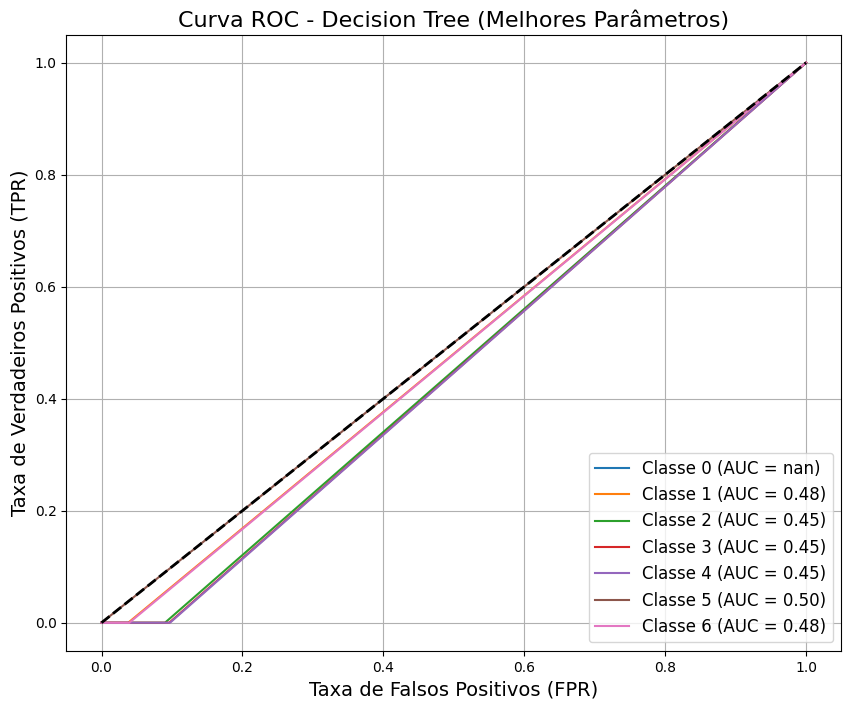

In [116]:
plot_roc_curve(best_model_dt, X_test, y_test, model_name="Decision Tree (Melhores Parâmetros)")

## 2.4. SVM (Support Vector Machine)


**Parametrização**

In [117]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
import numpy as np
import pandas as pd
import random

C =[0.1, 1, 10, 100]  # Valores comuns para o parâmetro de regularização
kernel = ['linear', 'rbf', 'poly', 'sigmoid']  # Diferentes tipos de kernel suportados pelo SVM
gamma =  ['scale', 'auto', 0.01, 0.1, 1]  # Configurações padrão e valores manuais para gamma


# Definindo o espaço de busca para os hiperparâmetros do GLVQ

# Número de combinações aleatórias a serem testadas
n_iter = 20

import random

C = [0.1, 1, 10, 100]
kernel = ['linear', 'rbf', 'poly', 'sigmoid']
gamma = ['scale', 'auto', 0.01, 0.1, 1]

# Número de combinações aleatórias a serem testadas
n_iter = 20

# Gerando combinações únicas de parâmetros
random_combinations = set()
while len(random_combinations) < n_iter:
    params = (
        random.choice(C),
        random.choice(kernel),
        random.choice(gamma)
    )
    random_combinations.add(params)

# Convertendo para lista de dicionários
random_combinations = [
    {'C': c, 'kernel': k, 'gamma': g} for c, k, g in random_combinations
]

print(random_combinations)

# Configurando validação cruzada com 10 folds
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lista para armazenar os resultados
results = []
count = 0
# Loop sobre as combinações aleatórias
for params in random_combinations:
    count = count + 1
    C_param = params['C']
    kernel = params['kernel']
    gamma = params['gamma']

    print(f"{count} Treinando para C={C_param},kernel {kernel},gamma {gamma}")

    fold_results = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}

    # Validação cruzada
    for train_index, test_index in kf.split(X_train):
        X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
        y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]
        model_params = {
                            'C': C_param,
                            'kernel': kernel,
                            'gamma': gamma,
                        }
        # Treinamento do modelo
        svm = SVC(C=model_params['C'], kernel=model_params['kernel'],gamma =model_params['gamma'],  probability=True)
        svm.fit(X_train_fold, y_train_fold)

        # Previsões e cálculo de métricas para cada fold
        y_pred_fold = svm.predict(X_test_fold)

        fold_results['accuracy'].append(accuracy_score(y_test_fold, y_pred_fold))
        fold_results['recall'].append(recall_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['precision'].append(precision_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['f1'].append(f1_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['acsa'].append(get_acsa(y_test_fold,y_pred_fold))


        try:
                  fold_results['roc_auc'].append(
                      roc_auc_score(y_test_fold, svm.predict_proba(X_test_fold), multi_class='ovr')
                  )
        except ValueError:
            fold_results['roc_auc'].append(np.nan)

    results.append({
              'C': model_params['C'],
              'kernel': model_params['kernel'],
              'gamma':model_params['gamma'],
              'accuracy': np.mean(fold_results['accuracy']),
              'recall': np.mean(fold_results['recall']),
              'precision': np.mean(fold_results['precision']),
              'f1': np.mean(fold_results['f1']),
              'roc_auc': np.nanmean(fold_results['roc_auc']),
              'acsa': np.nanmean(fold_results['acsa'])
          })

# Convertendo os resultados em um DataFrame
results_svm = pd.DataFrame(results)


[{'C': 0.1, 'kernel': 'poly', 'gamma': 1}, {'C': 100, 'kernel': 'sigmoid', 'gamma': 1}, {'C': 10, 'kernel': 'poly', 'gamma': 0.01}, {'C': 0.1, 'kernel': 'rbf', 'gamma': 1}, {'C': 100, 'kernel': 'sigmoid', 'gamma': 0.1}, {'C': 1, 'kernel': 'rbf', 'gamma': 1}, {'C': 0.1, 'kernel': 'sigmoid', 'gamma': 1}, {'C': 1, 'kernel': 'rbf', 'gamma': 0.1}, {'C': 10, 'kernel': 'poly', 'gamma': 'scale'}, {'C': 0.1, 'kernel': 'linear', 'gamma': 1}, {'C': 1, 'kernel': 'linear', 'gamma': 1}, {'C': 0.1, 'kernel': 'sigmoid', 'gamma': 0.1}, {'C': 10, 'kernel': 'rbf', 'gamma': 1}, {'C': 1, 'kernel': 'poly', 'gamma': 0.01}, {'C': 100, 'kernel': 'poly', 'gamma': 1}, {'C': 100, 'kernel': 'sigmoid', 'gamma': 'auto'}, {'C': 10, 'kernel': 'linear', 'gamma': 1}, {'C': 0.1, 'kernel': 'poly', 'gamma': 0.01}, {'C': 10, 'kernel': 'linear', 'gamma': 0.1}, {'C': 0.1, 'kernel': 'rbf', 'gamma': 0.01}]
1 Treinando para C=0.1,kernel poly,gamma 1
2 Treinando para C=100,kernel sigmoid,gamma 1
3 Treinando para C=10,kernel poly,

c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

4 Treinando para C=0.1,kernel rbf,gamma 1
5 Treinando para C=100,kernel sigmoid,gamma 0.1
6 Treinando para C=1,kernel rbf,gamma 1
7 Treinando para C=0.1,kernel sigmoid,gamma 1
8 Treinando para C=1,kernel rbf,gamma 0.1
9 Treinando para C=10,kernel poly,gamma scale
10 Treinando para C=0.1,kernel linear,gamma 1
11 Treinando para C=1,kernel linear,gamma 1
12 Treinando para C=0.1,kernel sigmoid,gamma 0.1


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


13 Treinando para C=10,kernel rbf,gamma 1
14 Treinando para C=1,kernel poly,gamma 0.01


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

15 Treinando para C=100,kernel poly,gamma 1
16 Treinando para C=100,kernel sigmoid,gamma auto
17 Treinando para C=10,kernel linear,gamma 1
18 Treinando para C=0.1,kernel poly,gamma 0.01


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

19 Treinando para C=10,kernel linear,gamma 0.1
20 Treinando para C=0.1,kernel rbf,gamma 0.01


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

In [118]:

# Exibindo as 5 melhores combinações de parâmetros
print(results_svm.sort_values(by='accuracy', ascending=False).head(5))


        C kernel  gamma  accuracy    recall  precision        f1   roc_auc  \
14  100.0   poly      1  0.971753  0.971728   0.972449  0.971561  0.998617   
8    10.0   poly  scale  0.971753  0.971751   0.972357  0.971545  0.998604   
12   10.0    rbf      1  0.930032  0.930126   0.930456  0.928935  0.996841   
5     1.0    rbf      1  0.881829  0.881874   0.883892  0.877557  0.989327   
0     0.1   poly      1  0.802922  0.803254   0.813456  0.791771  0.969703   

        acsa  
14  0.971728  
8   0.971751  
12  0.930126  
5   0.881874  
0   0.803254  


In [119]:
results_svm.to_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_svm.csv', index= False)

** Resultado da modelagem**

In [120]:
metrics = ["precision", "accuracy", "recall", "f1", "roc_auc","acsa"]
best_row, rankings = rank_and_select_best(results_svm, metrics)
best_row

C               100.0
kernel           poly
gamma               1
accuracy     0.971753
recall       0.971728
precision    0.972449
f1           0.971561
roc_auc      0.998617
acsa         0.971728
mean_rank    1.333333
Name: 14, dtype: object

**Melhor modelo**

In [121]:
best_C =best_row['C']
best_kernel = best_row['kernel']
best_gamma = float(best_row['gamma'])
best_score = best_row['accuracy']

print(f"Melhor C: {best_C}")
print(f"Melhor kernel: {best_kernel}")
print(f"Melhor gamma: {best_gamma}")
print(f"Melhor acurácia: {best_score}")


best_model_svm = SVC(C=best_C, kernel=best_kernel,gamma =best_gamma,  probability=True)
best_model_svm.fit(X_train, y_train)


Melhor C: 100.0
Melhor kernel: poly
Melhor gamma: 1.0
Melhor acurácia: 0.9717534256701814


SVC(C=100.0, gamma=1.0, kernel='poly', probability=True)

In [122]:
start_time_svm= timeit.default_timer()
y_pred_best_svm = best_model_svm.predict(X_test)
infer_time_svm = timeit.default_timer() - start_time_svm
print(infer_time_svm)

0.12365339999087155


In [123]:
results_svm_best = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}

In [124]:
results_svm_best['accuracy'] = accuracy_score(y_test, y_pred_best_svm)
results_svm_best['recall']=recall_score(y_test, y_pred_best_svm, average='macro')
results_svm_best['precision']=precision_score(y_test, y_pred_best_svm, average='macro')
results_svm_best['f1']=f1_score(y_test, y_pred_best_svm, average='macro')
results_svm_best['roc_auc'] = roc_auc_score(y_test, best_model_svm.predict_proba(X_test), multi_class='ovr')
results_svm_best['acsa']   = get_acsa(y_test,y_pred_best_svm)

c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [125]:
print(results_svm_best)

{'accuracy': 0.3863777089783282, 'recall': 0.5367368511316308, 'precision': 0.41933469192844636, 'f1': 0.2574587039866534, 'roc_auc': 0.8319772476535741, 'acsa': 0.5367368511316308}


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


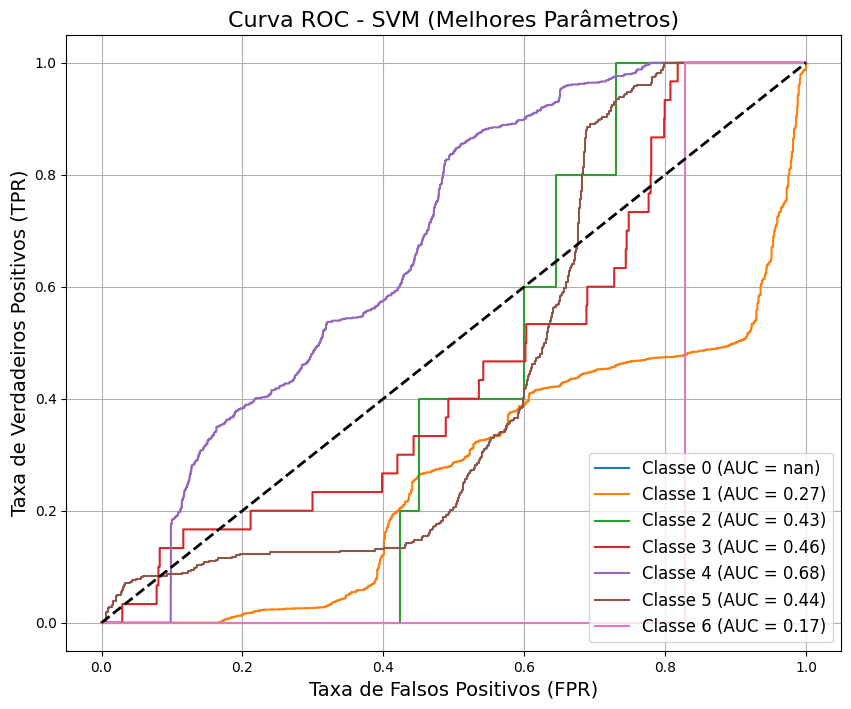

In [126]:
plot_roc_curve(best_model_svm, X_test, y_test, model_name="SVM (Melhores Parâmetros)")

## 2.5. Random Forest

In [127]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
import numpy as np
import pandas as pd

n_estimators=[10,20, 50, 100, 200]
max_depth= [None, 5, 10, 20]
# Definindo o espaço de busca para os hiperparâmetros do GLVQ

# Número de combinações aleatórias a serem testadas
n_iter = 20
# Gerando combinações aleatórias de parâmetros
random_combinations = set()
while len(random_combinations) < n_iter:
    params = (
        random.choice(n_estimators),
        random.choice(max_depth)
    )
    random_combinations.add(params)

# Convertendo as combinações únicas de volta para uma lista de dicionários
random_combinations = [
    {'n_estimators': combo[0], 'max_depth': combo[1]}
    for combo in random_combinations
]

# Configurando validação cruzada com 10 folds
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lista para armazenar os resultados
results = []

# Loop sobre as combinações aleatórias
for params in random_combinations:
    max_depth = params['max_depth']
    n_estimators = params['n_estimators']
    print(f"Treinando para max_depth={max_depth}, n_estimators {n_estimators}")

    fold_results = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}

    # Validação cruzada
    for train_index, test_index in kf.split(X_train):
        X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
        y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]
        model_params = {
                            'max_depth': max_depth,
                            'n_estimators': n_estimators,
                        }
        # Treinamento do modelo
        rf = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth, random_state=42)
        rf.fit(X_train_fold, y_train_fold)


        # Previsões e cálculo de métricas para cada fold
        y_pred_fold = rf.predict(X_test_fold)

        fold_results['accuracy'].append(accuracy_score(y_test_fold, y_pred_fold))
        fold_results['recall'].append(recall_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['precision'].append(precision_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['f1'].append(f1_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['acsa'].append(get_acsa(y_test_fold,y_pred_fold))

        try:
            fold_results['roc_auc'].append(
                roc_auc_score(y_test_fold, rf.predict_proba(X_test_fold), multi_class='ovr')
            )
        except ValueError:
            fold_results['roc_auc'].append(np.nan)

    # Armazenando os resultados para a combinação de parâmetros atual
    results.append({
        'max_depth': max_depth,
        'n_estimators': n_estimators,
        'accuracy': np.mean(fold_results['accuracy']),
        'recall': np.mean(fold_results['recall']),
        'precision': np.mean(fold_results['precision']),
        'f1': np.mean(fold_results['f1']),
        'roc_auc': np.nanmean(fold_results['roc_auc']),  # Calcula média ignorando NaN
        'acsa': np.nanmean(fold_results['acsa'])
    })
# Convertendo os resultados em um DataFrame
results_rf = pd.DataFrame(results)

# Exibindo as 5 melhores combinações de parâmetros
print(results_rf.sort_values(by='accuracy', ascending=False).head(5))

Treinando para max_depth=5, n_estimators 20
Treinando para max_depth=None, n_estimators 200
Treinando para max_depth=10, n_estimators 100
Treinando para max_depth=20, n_estimators 20
Treinando para max_depth=5, n_estimators 200
Treinando para max_depth=None, n_estimators 50
Treinando para max_depth=20, n_estimators 200
Treinando para max_depth=None, n_estimators 10
Treinando para max_depth=10, n_estimators 20
Treinando para max_depth=5, n_estimators 50
Treinando para max_depth=5, n_estimators 10
Treinando para max_depth=20, n_estimators 50
Treinando para max_depth=None, n_estimators 100
Treinando para max_depth=10, n_estimators 200
Treinando para max_depth=20, n_estimators 10
Treinando para max_depth=5, n_estimators 100
Treinando para max_depth=20, n_estimators 100
Treinando para max_depth=10, n_estimators 50
Treinando para max_depth=None, n_estimators 20
Treinando para max_depth=10, n_estimators 10
    max_depth  n_estimators  accuracy    recall  precision        f1  \
16       20.0  

In [128]:
results_rf.to_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_rf.csv', index= False)

**Resultado da modelagem**

In [129]:
best_row, rankings = rank_and_select_best(results_rf, metrics)
best_row

max_depth        20.000000
n_estimators    100.000000
accuracy          0.993780
recall            0.993781
precision         0.993846
f1                0.993776
roc_auc           0.999790
acsa              0.993781
mean_rank         2.333333
Name: 16, dtype: float64

**Melhor modelo**

In [130]:
best_n_estimators = int(best_row['n_estimators'])
best_max_depth = int(best_row['max_depth']) if not pd.isna(best_row['max_depth']) else None

best_model_rf = RandomForestClassifier(
                        max_depth=best_max_depth,
                        n_estimators=best_n_estimators,
                        random_state=42
                    )
best_model_rf.fit(X_train, y_train)
y_pred_best = best_model_rf.predict(X_test)

In [131]:
best_model_rf.fit(X_train, y_train)

RandomForestClassifier(max_depth=20, random_state=42)

In [132]:
start_time_rf= timeit.default_timer()
y_pred_best_rf = best_model_rf.predict(X_test)
infer_time_rf = timeit.default_timer() - start_time_rf
print(infer_time_rf)

0.06343879998894408


In [133]:


y_best_pred = best_model_rf.predict(X_test)
val_accuracy = accuracy_score(y_test, y_best_pred)
print(f"Acurácia no conjunto de teste: {val_accuracy:.4f}")
print("Desempenho no Conjunto de teste:\n")
print(classification_report(y_test, y_best_pred, zero_division=1))

Acurácia no conjunto de teste: 0.8345
Desempenho no Conjunto de teste:

              precision    recall  f1-score   support

           1       0.90      0.89      0.89      3498
           2       0.11      0.60      0.18         5
           3       0.16      0.43      0.23        30
           4       0.99      0.59      0.74       927
           5       1.00      1.00      1.00       381
           6       1.00      0.00      0.00         1
           7       0.00      0.33      0.01         3

    accuracy                           0.83      4845
   macro avg       0.59      0.55      0.44      4845
weighted avg       0.92      0.83      0.87      4845



In [134]:
results_rf_best = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}



In [ ]:
results_rf_best = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': []}
results_rf_best['accuracy'] = accuracy_score(y_test, y_best_pred)
results_rf_best['recall']=recall_score(y_test, y_best_pred, average='macro')
results_rf_best['precision']=precision_score(y_test, y_best_pred, average='macro')
results_rf_best['f1']=f1_score(y_test, y_best_pred, average='macro')
results_rf_best['roc_auc'] = roc_auc_score(y_test, best_model_rf.predict_proba(X_test), multi_class='ovr')
results_rf_best['acsa']   = get_acsa(y_test,y_pred_best_svm)

In [135]:
print(results_rf_best)

{'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [], 'acsa': []}


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


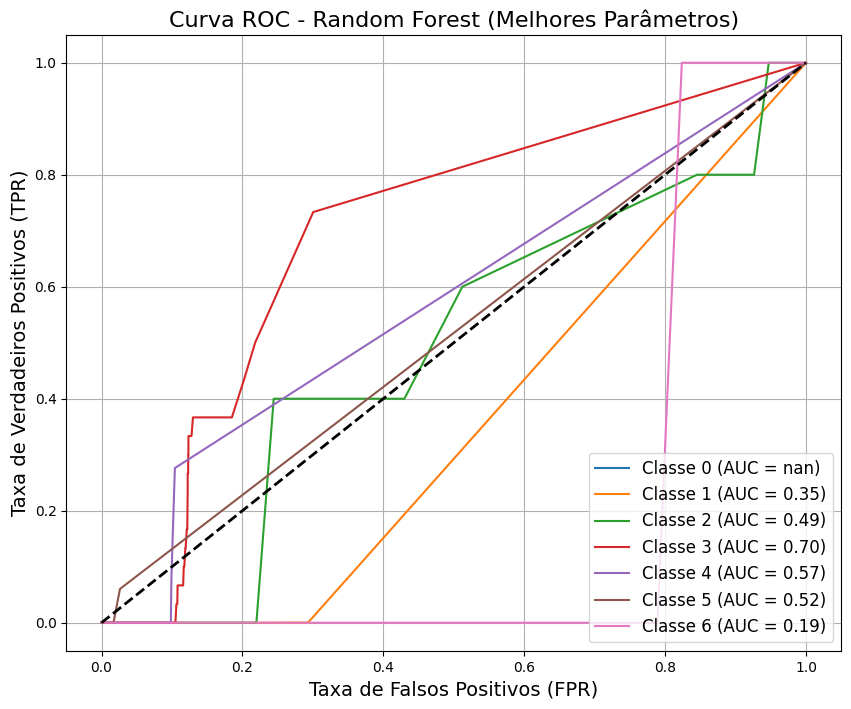

In [136]:
plot_roc_curve(best_model_rf, X_test, y_test, model_name="Random Forest (Melhores Parâmetros)")

## 2.6. Rede Neural MLP (Multilayer Perceptron)


**Parametrização**

In [137]:
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
import numpy as np
import pandas as pd
import random

hidden_layer_sizes=  [(100,), (100, 100, 100), (50, 80, 100), (10, 10, 10)]
activation =  ['relu', 'tanh', 'logistic', 'identity']
solver = ['adam', 'lbfgs']
alpha = [0.1, 0.01, 0.005]
learning_rate = ['constant', 'adaptive']

# Definindo o espaço de busca para os hiperparâmetros do GLVQ

# Número de combinações aleatórias a serem testadas
n_iter = 20

# Gerando combinações aleatórias de parâmetros
random_combinations = []
for _ in range(n_iter):
    params = {
        'hidden_layer_sizes': random.choice(hidden_layer_sizes),
        'activation': random.choice(activation),
        'solver': random.choice(solver),
        'alpha': random.choice(alpha),
        'learning_rate': random.choice(learning_rate),

    }
    random_combinations.append(params)
print(random_combinations)
# Configurando validação cruzada com 10 folds
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lista para armazenar os resultados
results = []

# Loop sobre as combinações aleatórias
for params in random_combinations:
    hidden_layer_sizes = params['hidden_layer_sizes']
    activation = params['activation']
    solver = params['solver']
    alpha = params['alpha']
    learning_rate = params['learning_rate']

    print(f"Treinando para hidden_layer_sizes={hidden_layer_sizes},activation {activation},solver {solver},alpha {alpha},learning_rate {learning_rate}")

    fold_results = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}

    # Validação cruzada
    for train_index, test_index in kf.split(X_train):
        X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
        y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]
        model_params = {
                            'hidden_layer_sizes': hidden_layer_sizes,
                            'activation': activation,
                            'solver': solver,
                            'alpha': alpha,
                            'learning_rate': learning_rate,
                        }
        # Treinamento do modelo
        mlp = MLPClassifier(hidden_layer_sizes=hidden_layer_sizes, activation=activation, solver=solver, alpha=alpha, learning_rate=learning_rate, max_iter=300)  # Aumentando max_iter
        mlp.fit(X_train_fold, y_train_fold.values.ravel())  # Ajustando formato do y


        # Previsões e cálculo de métricas para cada fold
        y_pred_fold = mlp.predict(X_test_fold)

        fold_results['accuracy'].append(accuracy_score(y_test_fold, y_pred_fold))
        fold_results['recall'].append(recall_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['precision'].append(precision_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['f1'].append(f1_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['acsa'].append(get_acsa(y_test_fold,y_pred_fold))

        try:
            fold_results['roc_auc'].append(
                roc_auc_score(y_test_fold, rf.predict_proba(X_test_fold), multi_class='ovr')
            )
        except ValueError:
            fold_results['roc_auc'].append(np.nan)

    # Armazenando os resultados para a combinação de parâmetros atual
    results.append({
                        'hidden_layer_sizes': hidden_layer_sizes,
                        'activation': activation,
                        'solver': solver,
                        'alpha': alpha,
                        'learning_rate': learning_rate,
                        'accuracy': np.mean(fold_results['accuracy']),
                        'recall': np.mean(fold_results['recall']),
                        'precision': np.mean(fold_results['precision']),
                        'f1': np.mean(fold_results['f1']),
                        'roc_auc': np.nanmean(fold_results['roc_auc']),
                        'acsa': np.nanmean(fold_results['acsa'])
                    })


[{'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.005, 'learning_rate': 'adaptive'}, {'hidden_layer_sizes': (100, 100, 100), 'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.01, 'learning_rate': 'adaptive'}, {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'adaptive'}, {'hidden_layer_sizes': (100,), 'activation': 'logistic', 'solver': 'lbfgs', 'alpha': 0.005, 'learning_rate': 'adaptive'}, {'hidden_layer_sizes': (10, 10, 10), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'constant'}, {'hidden_layer_sizes': (50, 80, 100), 'activation': 'logistic', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'adaptive'}, {'hidden_layer_sizes': (10, 10, 10), 'activation': 'identity', 'solver': 'adam', 'alpha': 0.01, 'learning_rate': 'constant'}, {'hidden_layer_sizes': (100,), 'activation': 'relu', 'solver': 'lbfgs', 'alpha': 0.1, 'learning_rate': 'constant'}, {'hidden_layer_

c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the opti

Treinando para hidden_layer_sizes=(100, 100, 100),activation relu,solver lbfgs,alpha 0.01,learning_rate adaptive


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando para hidden_layer_sizes=(100,),activation logistic,solver adam,alpha 0.01,learning_rate adaptive


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the opti

Treinando para hidden_layer_sizes=(100,),activation logistic,solver lbfgs,alpha 0.005,learning_rate adaptive


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando para hidden_layer_sizes=(10, 10, 10),activation logistic,solver adam,alpha 0.01,learning_rate constant


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted sa

Treinando para hidden_layer_sizes=(50, 80, 100),activation logistic,solver adam,alpha 0.01,learning_rate adaptive


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the opti

Treinando para hidden_layer_sizes=(10, 10, 10),activation identity,solver adam,alpha 0.01,learning_rate constant
Treinando para hidden_layer_sizes=(100,),activation relu,solver lbfgs,alpha 0.1,learning_rate constant


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando para hidden_layer_sizes=(10, 10, 10),activation tanh,solver lbfgs,alpha 0.005,learning_rate adaptive


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando para hidden_layer_sizes=(50, 80, 100),activation logistic,solver adam,alpha 0.01,learning_rate constant


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the opti

Treinando para hidden_layer_sizes=(50, 80, 100),activation relu,solver lbfgs,alpha 0.1,learning_rate adaptive


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando para hidden_layer_sizes=(50, 80, 100),activation tanh,solver lbfgs,alpha 0.005,learning_rate adaptive


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando para hidden_layer_sizes=(50, 80, 100),activation relu,solver lbfgs,alpha 0.01,learning_rate constant


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando para hidden_layer_sizes=(100,),activation identity,solver lbfgs,alpha 0.1,learning_rate adaptive


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando para hidden_layer_sizes=(100, 100, 100),activation tanh,solver lbfgs,alpha 0.1,learning_rate adaptive


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando para hidden_layer_sizes=(10, 10, 10),activation relu,solver lbfgs,alpha 0.005,learning_rate constant


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando para hidden_layer_sizes=(10, 10, 10),activation tanh,solver lbfgs,alpha 0.1,learning_rate constant


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando para hidden_layer_sizes=(100, 100, 100),activation identity,solver adam,alpha 0.01,learning_rate constant
Treinando para hidden_layer_sizes=(100,),activation logistic,solver adam,alpha 0.01,learning_rate adaptive


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the opti

Treinando para hidden_layer_sizes=(100,),activation relu,solver adam,alpha 0.1,learning_rate adaptive


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the opti

In [138]:

results_mlp = pd.DataFrame(results)
print(results_mlp.sort_values(by='accuracy', ascending=False).head(5))

   hidden_layer_sizes activation solver  alpha learning_rate  accuracy  \
14    (100, 100, 100)       tanh  lbfgs  0.100      adaptive  0.984581   
11      (50, 80, 100)       tanh  lbfgs  0.005      adaptive  0.983285   
3              (100,)   logistic  lbfgs  0.005      adaptive  0.979787   
7              (100,)       relu  lbfgs  0.100      constant  0.957370   
16       (10, 10, 10)       tanh  lbfgs  0.100      constant  0.940269   

      recall  precision        f1   roc_auc      acsa  
14  0.984563   0.984824  0.984438  0.999896  0.984563  
11  0.983116   0.983348  0.983048  0.999896  0.983116  
3   0.979707   0.980229  0.979687  0.999896  0.979707  
7   0.957345   0.957523  0.957080  0.999896  0.957345  
16  0.939936   0.941385  0.939209  0.999896  0.939936  


In [139]:
results_mlp.to_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_mlp.csv', index=False)

**Resultado da modelagem**

In [140]:
metrics = ["precision", "accuracy", "recall", "f1", "roc_auc","acsa"]
best_row, rankings = rank_and_select_best(results_mlp, metrics)
best_row

hidden_layer_sizes    (100, 100, 100)
activation                       tanh
solver                          lbfgs
alpha                             0.1
learning_rate                adaptive
accuracy                     0.984581
recall                       0.984563
precision                    0.984824
f1                           0.984438
roc_auc                      0.999896
acsa                         0.984563
mean_rank                    2.583333
Name: 14, dtype: object

**Melhor modelo**

In [141]:
import ast  # Para converter a string em uma tupla válida

In [142]:
best_hidden_layer_sizes = best_row['hidden_layer_sizes']
best_activation = best_row['activation']
best_solver = best_row['solver']
best_alpha = best_row['alpha']
best_learning_rate = best_row['learning_rate']
best_hidden_layer_sizes = ast.literal_eval(best_row['hidden_layer_sizes']) \
    if isinstance(best_row['hidden_layer_sizes'], str) else best_row['hidden_layer_sizes']


best_model_mlp = MLPClassifier(hidden_layer_sizes=best_hidden_layer_sizes,
                               activation=best_activation,
                               solver=best_solver,
                               alpha=best_alpha,
                               learning_rate=best_learning_rate,
                               max_iter=300
                  )

best_model_mlp.fit(X_train, y_train)


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


MLPClassifier(activation='tanh', alpha=0.1, hidden_layer_sizes=(100, 100, 100),
              learning_rate='adaptive', max_iter=300, solver='lbfgs')

In [143]:
start_time_mlp= timeit.default_timer()
y_pred_best = best_model_mlp.predict(X_test)
infer_time_mlp = timeit.default_timer() - start_time_mlp
print(infer_time_mlp)

0.023384900006931275


In [144]:
val_accuracy = accuracy_score(y_test, y_best_pred)
print(f"Acurácia no conjunto de teste: {val_accuracy:.4f}")
print("Desempenho no Conjunto de teste:\n")
print(classification_report(y_test, y_best_pred, zero_division=1))

Acurácia no conjunto de teste: 0.8345
Desempenho no Conjunto de teste:

              precision    recall  f1-score   support

           1       0.90      0.89      0.89      3498
           2       0.11      0.60      0.18         5
           3       0.16      0.43      0.23        30
           4       0.99      0.59      0.74       927
           5       1.00      1.00      1.00       381
           6       1.00      0.00      0.00         1
           7       0.00      0.33      0.01         3

    accuracy                           0.83      4845
   macro avg       0.59      0.55      0.44      4845
weighted avg       0.92      0.83      0.87      4845



In [145]:
results_mlp_best = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}

In [146]:
results_mlp_best['accuracy'] = accuracy_score(y_test, y_pred_best)
results_mlp_best['recall']=recall_score(y_test, y_pred_best, average='macro')
results_mlp_best['precision']=precision_score(y_test, y_pred_best, average='macro')
results_mlp_best['f1']=f1_score(y_test, y_pred_best, average='macro')
results_mlp_best['roc_auc'] = roc_auc_score(y_test, best_model_mlp.predict_proba(X_test), multi_class='ovr')
results_mlp_best['acsa']   = get_acsa(y_test,y_pred_best)

In [147]:
print(results_mlp_best)

{'accuracy': 0.8586171310629515, 'recall': 0.49316867394606534, 'precision': 0.4601384119849417, 'f1': 0.41782837729197725, 'roc_auc': 0.9089935347231165, 'acsa': 0.49316867394606534}


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


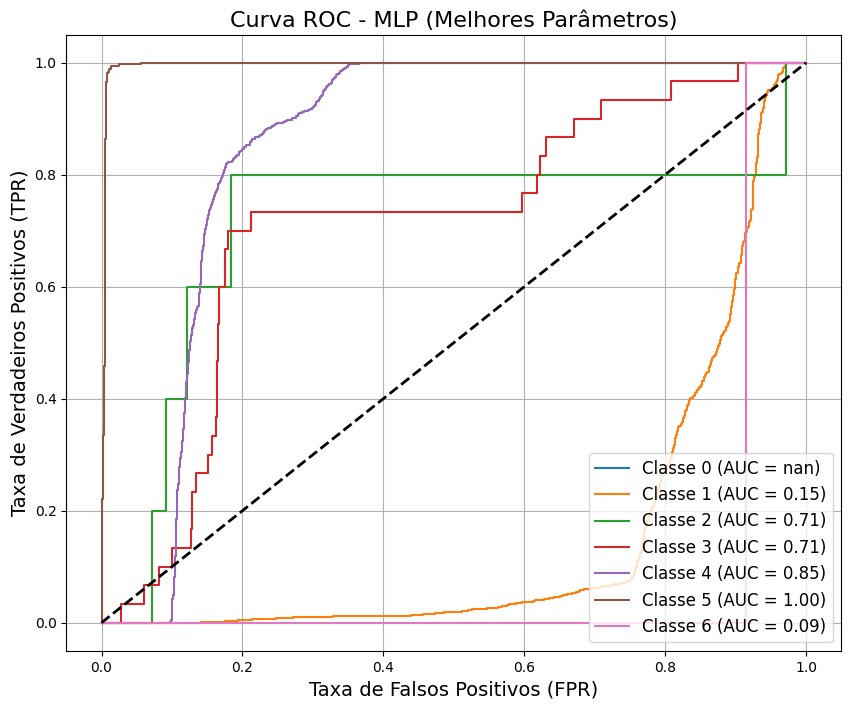

In [148]:
plot_roc_curve(best_model_mlp, X_test, y_test, model_name="MLP (Melhores Parâmetros)")

## 2.7. Comitê de Redes Neurais Artificiais

**Parametrização**

In [159]:
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np
import random

# Definindo o espaço de busca para os hiperparâmetros
hidden_layer_options = [(32,), (64, 32), (128, 64, 32)]  # Arquiteturas
alphas = [0.0001, 0.001, 0.01]  # Taxas de regularização
activations = ['relu', 'tanh', 'logistic']  # Funções de ativação
solvers = ['adam', 'sgd', 'lbfgs']  # Solvers disponíveis
max_iter_options = [200, 300, 500]  # Número máximo de iterações

# Número de combinações aleatórias a serem testadas
n_iter = 20

# Gerando combinações aleatórias de parâmetros
random_combinations = []
for _ in range(n_iter):
    params = {
        'hidden_layers': random.choice(hidden_layer_options),
        'alpha': random.choice(alphas),
        'activation': random.choice(activations),
        'solver': random.choice(solvers),
        'max_iter': random.choice(max_iter_options)
    }
    random_combinations.append(params)
print(random_combinations)

# Configurando validação cruzada com 10 folds
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lista para armazenar os resultados
results = []

# Loop sobre as combinações aleatórias
for params in random_combinations:
    hidden_layers = params['hidden_layers']
    alpha = params['alpha']
    activation = params['activation']
    solver = params['solver']
    max_iter = params['max_iter']
    print(f"Treinando com hidden_layers={hidden_layers}, alpha={alpha}, activation={activation}, solver={solver}, max_iter={max_iter}")

    fold_results = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}

    # Validação cruzada
    for train_index, test_index in kf.split(X_train):
        X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
        y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]

        # Criar os MLPClassifiers
        mlp1 = MLPClassifier(hidden_layer_sizes=hidden_layers, alpha=alpha, activation=activation, solver=solver, max_iter=max_iter, random_state=1)
        mlp2 = MLPClassifier(hidden_layer_sizes=hidden_layers, alpha=alpha, activation=activation, solver=solver, max_iter=max_iter, random_state=2)
        mlp3 = MLPClassifier(hidden_layer_sizes=hidden_layers, alpha=alpha, activation=activation, solver=solver, max_iter=max_iter, random_state=3)

        # Criar um comitê de redes neurais
        ensemble = VotingClassifier(estimators=[
            ('mlp1', mlp1),
            ('mlp2', mlp2),
            ('mlp3', mlp3)
        ], voting='soft')

        # Treinamento do comitê
        ensemble.fit(X_train_fold, y_train_fold)

        # Previsões e cálculo de métricas para cada fold
        y_pred_fold = ensemble.predict(X_test_fold)
        fold_results['accuracy'].append(accuracy_score(y_test_fold, y_pred_fold))
        fold_results['recall'].append(recall_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['precision'].append(precision_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['f1'].append(f1_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['acsa'].append(get_acsa(y_test_fold,y_pred_fold))

        try:
            fold_results['roc_auc'].append(
                roc_auc_score(y_test_fold, ensemble.predict_proba(X_test_fold), multi_class='ovr')
            )
        except ValueError:
            fold_results['roc_auc'].append(np.nan)

    # Armazenando os resultados para a combinação de parâmetros atual
    results.append({
        'hidden_layers': hidden_layers,
        'alpha': alpha,
        'activation': activation,
        'solver': solver,
        'max_iter': max_iter,
        'accuracy': np.mean(fold_results['accuracy']),
        'recall': np.mean(fold_results['recall']),
        'precision': np.mean(fold_results['precision']),
        'f1': np.mean(fold_results['f1']),
        'roc_auc': np.nanmean(fold_results['roc_auc']),  # Calcula média ignorando NaN
        'acsa': np.mean(fold_results['acsa']),
    })

[{'hidden_layers': (32,), 'alpha': 0.0001, 'activation': 'logistic', 'solver': 'lbfgs', 'max_iter': 300}, {'hidden_layers': (128, 64, 32), 'alpha': 0.001, 'activation': 'relu', 'solver': 'adam', 'max_iter': 500}, {'hidden_layers': (128, 64, 32), 'alpha': 0.0001, 'activation': 'relu', 'solver': 'adam', 'max_iter': 200}, {'hidden_layers': (32,), 'alpha': 0.001, 'activation': 'tanh', 'solver': 'lbfgs', 'max_iter': 200}, {'hidden_layers': (32,), 'alpha': 0.0001, 'activation': 'logistic', 'solver': 'adam', 'max_iter': 200}, {'hidden_layers': (64, 32), 'alpha': 0.0001, 'activation': 'tanh', 'solver': 'lbfgs', 'max_iter': 200}, {'hidden_layers': (128, 64, 32), 'alpha': 0.001, 'activation': 'logistic', 'solver': 'lbfgs', 'max_iter': 300}, {'hidden_layers': (64, 32), 'alpha': 0.01, 'activation': 'relu', 'solver': 'lbfgs', 'max_iter': 200}, {'hidden_layers': (32,), 'alpha': 0.001, 'activation': 'relu', 'solver': 'lbfgs', 'max_iter': 500}, {'hidden_layers': (64, 32), 'alpha': 0.01, 'activation': 

c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando com hidden_layers=(128, 64, 32), alpha=0.001, activation=relu, solver=adam, max_iter=500
Treinando com hidden_layers=(128, 64, 32), alpha=0.0001, activation=relu, solver=adam, max_iter=200


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Treinando com hidden_layers=(32,), alpha=0.001, activation=tanh, solver=lbfgs, max_iter=200


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando com hidden_layers=(32,), alpha=0.0001, activation=logistic, solver=adam, max_iter=200


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the opti

Treinando com hidden_layers=(64, 32), alpha=0.0001, activation=tanh, solver=lbfgs, max_iter=200


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando com hidden_layers=(128, 64, 32), alpha=0.001, activation=logistic, solver=lbfgs, max_iter=300


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando com hidden_layers=(64, 32), alpha=0.01, activation=relu, solver=lbfgs, max_iter=200


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando com hidden_layers=(32,), alpha=0.001, activation=relu, solver=lbfgs, max_iter=500


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando com hidden_layers=(64, 32), alpha=0.01, activation=tanh, solver=adam, max_iter=200


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the opti

Treinando com hidden_layers=(64, 32), alpha=0.0001, activation=logistic, solver=lbfgs, max_iter=500


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando com hidden_layers=(64, 32), alpha=0.01, activation=tanh, solver=lbfgs, max_iter=500


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando com hidden_layers=(32,), alpha=0.01, activation=logistic, solver=adam, max_iter=500


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the opti

Treinando com hidden_layers=(128, 64, 32), alpha=0.001, activation=logistic, solver=lbfgs, max_iter=500


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando com hidden_layers=(32,), alpha=0.001, activation=logistic, solver=lbfgs, max_iter=300


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando com hidden_layers=(32,), alpha=0.01, activation=relu, solver=sgd, max_iter=300


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the opti

Treinando com hidden_layers=(128, 64, 32), alpha=0.01, activation=tanh, solver=sgd, max_iter=300


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the optimization hasn't converged yet.
  warnings.warn(
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (300) reached and the opti

Treinando com hidden_layers=(64, 32), alpha=0.001, activation=relu, solver=lbfgs, max_iter=200


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando com hidden_layers=(32,), alpha=0.01, activation=relu, solver=lbfgs, max_iter=300


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptr

Treinando com hidden_layers=(128, 64, 32), alpha=0.01, activation=logistic, solver=sgd, max_iter=200


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\U

In [160]:
results_nn = pd.DataFrame(results)
results_nn.to_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_comiteRN.csv', index= False)
results_nn.head()

,hidden_layers,alpha,activation,solver,max_iter,accuracy,recall,precision,f1,roc_auc,acsa
0,"(32,)",0.0001,logistic,lbfgs,300,0.982766,0.982761,0.982963,0.982646,0.999401,0.982761
1,"(128, 64, 32)",0.0010,relu,adam,500,0.982248,0.982118,0.982773,0.982114,0.999462,0.982118
2,"(128, 64, 32)",0.0001,relu,adam,200,0.981471,0.981344,0.982152,0.981399,0.999422,0.981344
3,"(32,)",0.0010,tanh,lbfgs,200,0.970328,0.970145,0.970422,0.969953,0.998445,0.970145
4,"(32,)",0.0001,logistic,adam,200,0.731142,0.731207,0.730744,0.716334,0.938778,0.731207


**Resultado da modelagem**

In [172]:
metrics = ["precision", "accuracy", "recall", "f1", "roc_auc","acsa"]
best_row, rankings = rank_and_select_best(results_nn, metrics)
best_row

hidden_layers    (64, 32)
alpha                0.01
activation           tanh
solver              lbfgs
max_iter              500
accuracy         0.988338
recall           0.988286
precision        0.988408
f1               0.988192
roc_auc          0.999563
acsa             0.988286
mean_rank             1.0
Name: 11, dtype: object

**Melhor modelo**

In [173]:
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
from sklearn.model_selection import KFold
import pandas as pd
import numpy as np
import random

In [174]:
best_row

hidden_layers    (64, 32)
alpha                0.01
activation           tanh
solver              lbfgs
max_iter              500
accuracy         0.988338
recall           0.988286
precision        0.988408
f1               0.988192
roc_auc          0.999563
acsa             0.988286
mean_rank             1.0
Name: 11, dtype: object

In [175]:
best_hidden_layers =  best_row['hidden_layers']
best_alpha = best_row['alpha']
best_activation = best_row['activation']
best_solver = best_row['solver']
best_max_iter = best_row['max_iter']

In [176]:
 # Criar os MLPClassifiers
mlp1 = MLPClassifier(hidden_layer_sizes=best_hidden_layers, alpha=best_alpha, activation=best_activation, solver=best_solver, max_iter=best_max_iter, random_state=1)
mlp2 = MLPClassifier(hidden_layer_sizes=best_hidden_layers, alpha=best_alpha, activation=best_activation, solver=best_solver, max_iter=best_max_iter, random_state=2)
mlp3 = MLPClassifier(hidden_layer_sizes=best_hidden_layers, alpha=best_alpha, activation=best_activation, solver=best_solver, max_iter=best_max_iter, random_state=3)

# Criar um comitê de redes neurais
best_model_ensemble = VotingClassifier(estimators=[
            ('mlp1', mlp1),
            ('mlp2', mlp2),
            ('mlp3', mlp3)
        ], voting='soft')


In [177]:
best_model_ensemble.fit(X_train, y_train)
start_time_ensemble= timeit.default_timer()
y_best_pred = best_model_ensemble.predict(X_test)
infer_time_ensemble = timeit.default_timer() - start_time_ensemble
print(infer_time_ensemble)

c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)
c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


0.046119899954646826


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


In [178]:
val_accuracy = accuracy_score(y_test, y_best_pred)
print(f"Acurácia no conjunto de teste: {val_accuracy:.4f}")
print("Desempenho no Conjunto de teste:\n")
print(classification_report(y_test, y_best_pred, zero_division=1))

Acurácia no conjunto de teste: 0.5719
Desempenho no Conjunto de teste:

              precision    recall  f1-score   support

           1       0.89      0.64      0.74      3498
           2       0.01      0.40      0.02         5
           3       0.05      0.67      0.09        30
           4       0.99      0.16      0.27       927
           5       1.00      0.98      0.99       381
           6       1.00      0.00      0.00         1
           7       0.00      1.00      0.00         3

    accuracy                           0.57      4845
   macro avg       0.56      0.55      0.30      4845
weighted avg       0.91      0.57      0.67      4845



In [179]:
results_ensemble_best = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}


In [180]:
from sklearn.metrics import confusion_matrix
import numpy as np

# Matriz de Confusão
conf_matrix = confusion_matrix(y_test, y_best_pred)

# Calcular ACSA
class_accuracy = conf_matrix.diagonal() / conf_matrix.sum(axis=1)
acsa = np.mean(class_accuracy)

results_ensemble_best['acsa'] = acsa


In [181]:
results_ensemble_best['accuracy'] = accuracy_score(y_test, y_best_pred)
results_ensemble_best['recall']=recall_score(y_test, y_best_pred, average='macro')
results_ensemble_best['precision']=precision_score(y_test, y_best_pred, average='macro')
results_ensemble_best['f1']=f1_score(y_test, y_best_pred, average='macro')
results_ensemble_best['roc_auc'] = roc_auc_score(y_test, best_model_ensemble.predict_proba(X_test), multi_class='ovr')
results_ensemble_best['acsa']   = get_acsa(y_test,y_best_pred)

c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [182]:
print(results_ensemble_best)

{'accuracy': 0.5719298245614035, 'recall': 0.5480977775994457, 'precision': 0.42107115957969043, 'f1': 0.3026258252932329, 'roc_auc': 0.919667851947467, 'acsa': 0.5480977775994457}


c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


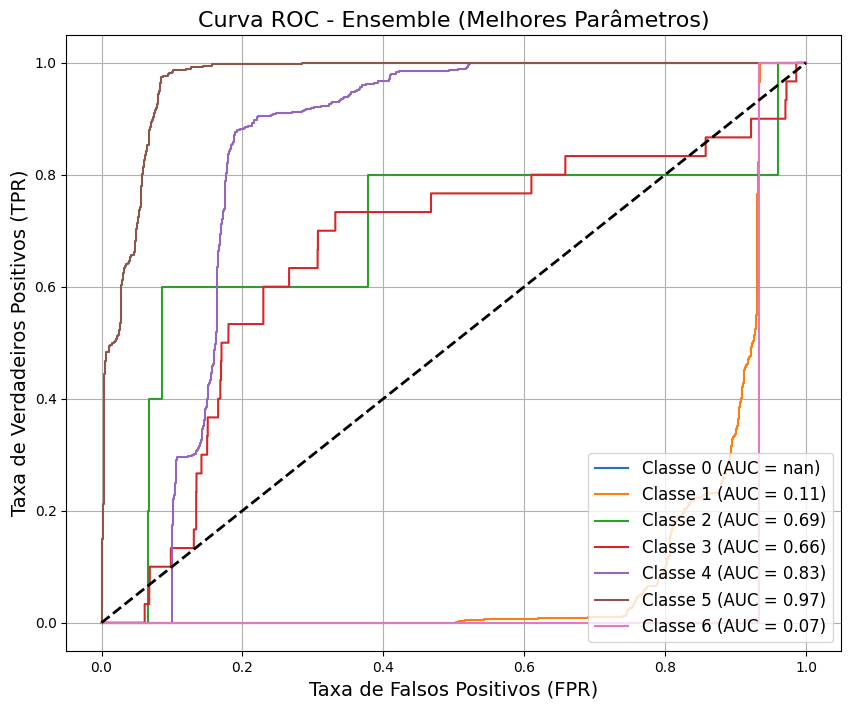

In [183]:
plot_roc_curve(best_model_ensemble, X_test, y_test, model_name="Ensemble (Melhores Parâmetros)")

##2.8. Comitê Heterogêneo (Stacking)

**Parametrização**

In [184]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.model_selection import KFold
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
from sklearn.linear_model import LogisticRegression
import numpy as np
import pandas as pd
import random

In [186]:


# Definindo o espaço de busca para os hiperparâmetros
knn_param_grid = {
    'n_neighbors': range(5, 50),  # valores de k de 5 a 49
    'metric': ["euclidean", "manhattan"]  # métricas de distância
}

dt_param_grid = {
    'max_depth': [3, 10, 20, 30, 40, 50],
    'min_samples_split': [2, 5, 10, 15],
    'min_samples_leaf': [1, 2, 5, 10],
    'criterion': ['gini', 'entropy']
}

rf_param_grid = {
    'n_estimators': [10, 50, 100, 200],  # número de árvores na floresta
    'max_depth': [None, 5, 10, 20]  # profundidade máxima da árvore
}

# Número de combinações aleatórias a serem testadas
n_iter = 20

# Gerando combinações aleatórias de parâmetros para cada modelo
random_combinations = []
for _ in range(n_iter):
    knn_params = {
        'n_neighbors': random.choice(knn_param_grid['n_neighbors']),
        'metric': random.choice(knn_param_grid['metric'])
    }
    dt_params = {
        'max_depth': random.choice(dt_param_grid['max_depth']),
        'min_samples_split': random.choice(dt_param_grid['min_samples_split']),
        'min_samples_leaf': random.choice(dt_param_grid['min_samples_leaf']),
        'criterion': random.choice(dt_param_grid['criterion'])
    }
    rf_params = {
        'n_estimators': random.choice(rf_param_grid['n_estimators']),
        'max_depth': random.choice(rf_param_grid['max_depth'])
    }

    random_combinations.append({
        'knn': knn_params,
        'dt': dt_params,
        'rf': rf_params
    })

# Configurando validação cruzada com 10 folds
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lista para armazenar os resultados
results = []

# Loop sobre as combinações aleatórias
for i, params in enumerate(random_combinations):
    knn_params = params['knn']
    dt_params = params['dt']
    rf_params = params['rf']

    print(f"\nTreinando para iteração {i + 1}/{n_iter} com KNN, Decision Tree e Random Forest")

    fold_results = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}


    # Validação cruzada
    for train_index, test_index in kf.split(X_train):
        X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
        y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]

        # Criando os modelos base
        knn = KNeighborsClassifier(n_neighbors=knn_params['n_neighbors'], metric=knn_params['metric'])
        dt = DecisionTreeClassifier(
            max_depth=dt_params['max_depth'],
            min_samples_split=dt_params['min_samples_split'],
            min_samples_leaf=dt_params['min_samples_leaf'],
            criterion=dt_params['criterion'],
            random_state=42
        )
        rf = RandomForestClassifier(
            n_estimators=rf_params['n_estimators'],
            max_depth=rf_params['max_depth'],
            random_state=42
        )

        # Criando o Stacking Classifier
        stacking = StackingClassifier(
            estimators=[('knn', knn), ('dt', dt), ('rf', rf)],
            final_estimator=LogisticRegression(random_state=42)
        )

        # Treinamento do modelo
        stacking.fit(X_train_fold, y_train_fold)

        # Previsões e cálculo de métricas para cada fold
        y_pred_fold = stacking.predict(X_test_fold)
        fold_results['accuracy'].append(accuracy_score(y_test_fold, y_pred_fold))
        fold_results['recall'].append(recall_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['precision'].append(precision_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['f1'].append(f1_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['acsa'].append(get_acsa(y_test_fold,y_pred_fold))


        try:
            fold_results['roc_auc'].append(
                roc_auc_score(y_test_fold, stacking.predict_proba(X_test_fold), multi_class='ovr')
            )
        except ValueError:
            fold_results['roc_auc'].append(np.nan)

    # Armazenando os resultados para a combinação de parâmetros atual
    results.append({
        'iteration': i + 1,
        'knn_n_neighbors': knn_params['n_neighbors'],
        'knn_metric': knn_params['metric'],
        'dt_max_depth': dt_params['max_depth'],
        'dt_min_samples_split': dt_params['min_samples_split'],
        'dt_min_samples_leaf': dt_params['min_samples_leaf'],
        'dt_criterion': dt_params['criterion'],
        'rf_n_estimators': rf_params['n_estimators'],
        'rf_max_depth': rf_params['max_depth'],
        'accuracy': np.mean(fold_results['accuracy']),
        'recall': np.mean(fold_results['recall']),
        'precision': np.mean(fold_results['precision']),
        'f1': np.mean(fold_results['f1']),
        'roc_auc': np.nanmean(fold_results['roc_auc']),  # Calcula média ignorando NaN
        'acsa': np.nanmean(fold_results['acsa'])  # Calcula média ignorando NaN
    })

# Convertendo os resultados para um DataFrame
results_stacking = pd.DataFrame(results)

# Exibindo as 5 melhores combinações de parâmetros
print(results_stacking.sort_values(by='accuracy', ascending=False).head(5))

# Salvando os resultados em um arquivo CSV
results_stacking.to_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\stacking_results.csv', index=False)
print("Resultados salvos no arquivo 'stacking_results.csv'.")


Treinando para iteração 1/20 com KNN, Decision Tree e Random Forest

Treinando para iteração 2/20 com KNN, Decision Tree e Random Forest

Treinando para iteração 3/20 com KNN, Decision Tree e Random Forest

Treinando para iteração 4/20 com KNN, Decision Tree e Random Forest

Treinando para iteração 5/20 com KNN, Decision Tree e Random Forest

Treinando para iteração 6/20 com KNN, Decision Tree e Random Forest

Treinando para iteração 7/20 com KNN, Decision Tree e Random Forest

Treinando para iteração 8/20 com KNN, Decision Tree e Random Forest

Treinando para iteração 9/20 com KNN, Decision Tree e Random Forest

Treinando para iteração 10/20 com KNN, Decision Tree e Random Forest

Treinando para iteração 11/20 com KNN, Decision Tree e Random Forest

Treinando para iteração 12/20 com KNN, Decision Tree e Random Forest

Treinando para iteração 13/20 com KNN, Decision Tree e Random Forest

Treinando para iteração 14/20 com KNN, Decision Tree e Random Forest

Treinando para iteração 15/2

**Resultados da modelagem**

In [187]:
metrics = ["precision", "accuracy", "recall", "f1", "roc_auc","acsa"]
best_row, rankings = rank_and_select_best(results_stacking, metrics)
best_row

iteration                      10
knn_n_neighbors                45
knn_metric              manhattan
dt_max_depth                   10
dt_min_samples_split           15
dt_min_samples_leaf             5
dt_criterion              entropy
rf_n_estimators               200
rf_max_depth                 20.0
accuracy                 0.993262
recall                   0.993293
precision                0.993294
f1                       0.993259
roc_auc                  0.999859
acsa                     0.993293
mean_rank                1.666667
Name: 9, dtype: object

**Melhor Modelo**

In [188]:
# Configuração dos modelos com os melhores hiperparâmetros
knn_best = KNeighborsClassifier(n_neighbors=best_row['knn_n_neighbors'], metric=best_row['knn_metric'])
dt_best = DecisionTreeClassifier(max_depth=best_row['dt_max_depth'], min_samples_split=best_row['dt_min_samples_split'], min_samples_leaf=best_row['dt_min_samples_leaf'], criterion=best_row['dt_criterion'])
rf_max_depth = None if np.isnan(best_row['rf_max_depth']) else int(best_row['rf_max_depth'])

rf_best = RandomForestClassifier(n_estimators=best_row['rf_n_estimators'], max_depth = rf_max_depth, random_state=42)

# Definição dos estimadores para o stacking
estimators = [
    ('knn', knn_best),
    ('decision_tree', dt_best),
    ('random_forest', rf_best)
]

# Configuração do modelo StackingClassifier
stacking_best = StackingClassifier(estimators=estimators, final_estimator=RandomForestClassifier(random_state=42))

# Treinando o modelo com os melhores hiperparâmetros
stacking_best.fit(X_train, y_train)

StackingClassifier(estimators=[('knn',
                                KNeighborsClassifier(metric='manhattan',
                                                     n_neighbors=45)),
                               ('decision_tree',
                                DecisionTreeClassifier(criterion='entropy',
                                                       max_depth=10,
                                                       min_samples_leaf=5,
                                                       min_samples_split=15)),
                               ('random_forest',
                                RandomForestClassifier(max_depth=20,
                                                       n_estimators=200,
                                                       random_state=42))],
                   final_estimator=RandomForestClassifier(random_state=42))

In [189]:
start_time_stacking= timeit.default_timer()
y_pred_final = stacking_best.predict(X_test)
infer_time_stacking = timeit.default_timer() - start_time_stacking
print(infer_time_stacking)


0.3455989001085982


In [190]:

# Avaliação do modelo
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score, roc_auc_score

accuracy = accuracy_score(y_test, y_pred_final)
recall = recall_score(y_test, y_pred_final, average='weighted')
precision = precision_score(y_test, y_pred_final, average='weighted')
f1 = f1_score(y_test, y_pred_final, average='weighted')
acsa =  get_acsa(y_test,y_best_pred)

# Para o AUC, é necessário usar as probabilidades de previsão
if hasattr(stacking_best, "predict_proba"):
    y_pred_proba = stacking_best.predict_proba(X_test)
    roc_auc = roc_auc_score(y_test, y_pred_proba, multi_class="ovr", average="weighted")
else:
    roc_auc = "AUC não disponível para este modelo"

# Exibindo as métricas
print(f"Melhor acurácia: {accuracy:.4f}")
print(f"Melhor métrica de recall: {recall:.4f}")
print(f"Melhor métrica de precision: {precision:.4f}")
print(f"Melhor métrica de f1: {f1:.4f}")
print(f"Melhor métrica de roc_auc: {roc_auc}")
print(f"Melhor métrica de Average Class-Specific Accuracy: {acsa}")

c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Melhor acurácia: 0.8582
Melhor métrica de recall: 0.8582
Melhor métrica de precision: 0.9215
Melhor métrica de f1: 0.8748
Melhor métrica de roc_auc: 0.8111098140427867
Melhor métrica de Average Class-Specific Accuracy: 0.5480977775994457


In [191]:
cmHt_best = {'acuracia': accuracy, 'recall' : recall, 'precision' : precision, 'f1' : f1, 'roc_auc' : roc_auc,'acsa':acsa}

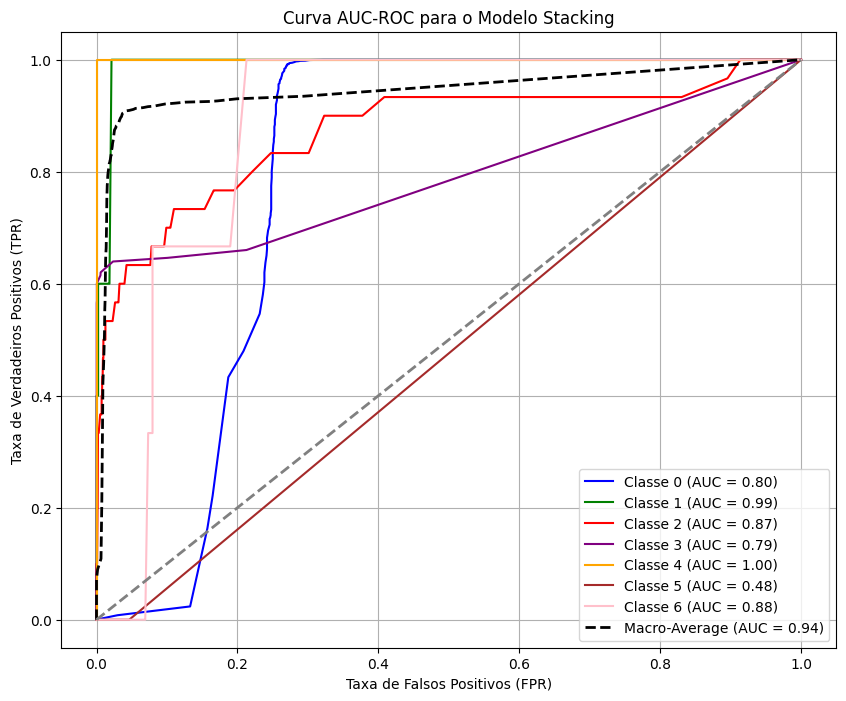

In [192]:
from sklearn.metrics import roc_curve, auc, RocCurveDisplay
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt

# Binarizar as classes para calcular a curva ROC multiclasse
y_test_binarized = label_binarize(y_test, classes=list(set(y_test)))
n_classes = y_test_binarized.shape[1]

# Obter as probabilidades previstas do modelo
y_pred_prob = stacking_best.predict_proba(X_test)

# Configuração da figura
plt.figure(figsize=(10, 8))
colors = ['blue', 'green', 'red', 'purple', 'orange', 'brown', 'pink']

# Curva ROC para cada classe
for i in range(n_classes):
    fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, color=colors[i % len(colors)],
             label=f"Classe {i} (AUC = {roc_auc:.2f})")

# Curva ROC média (macro)
fpr_micro, tpr_micro, _ = roc_curve(y_test_binarized.ravel(), y_pred_prob.ravel())
roc_auc_micro = auc(fpr_micro, tpr_micro)
plt.plot(fpr_micro, tpr_micro, color='black', linestyle='--', linewidth=2,
         label=f"Macro-Average (AUC = {roc_auc_micro:.2f})")

# Personalização do gráfico
plt.plot([0, 1], [0, 1], color='grey', linestyle='--', lw=2)
plt.xlabel("Taxa de Falsos Positivos (FPR)")
plt.ylabel("Taxa de Verdadeiros Positivos (TPR)")
plt.title("Curva AUC-ROC para o Modelo Stacking")
plt.legend(loc="lower right")
plt.grid()
plt.show()

## 2.9. XGBoost

**Parametrização**

In [193]:
# Definindo o espaço de busca para os hiperparâmetros
xgb_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'subsample': [0.6, 0.8, 1.0],
    'colsample_bytree': [0.6, 0.8, 1.0]
}

# Número de combinações aleatórias a serem testadas
n_iter = 20
random_combinations = []
for _ in range(n_iter):
    params = {
        'n_estimators': random.choice(xgb_param_grid['n_estimators']),
        'max_depth': random.choice(xgb_param_grid['max_depth']),
        'learning_rate': random.choice(xgb_param_grid['learning_rate']),
        'subsample': random.choice(xgb_param_grid['subsample']),
        'colsample_bytree': random.choice(xgb_param_grid['colsample_bytree']),
    }
    random_combinations.append(params)

# Configurando validação cruzada com 10 folds
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Reindexando as classes para o XGBoost (ajustando para iniciar de 0)
y_train_XGBoost = y_train - 1
y_test_XGBoost = y_test - 1

# Lista para armazenar os resultados
results = []

# Loop sobre as combinações aleatórias de parâmetros
for params in random_combinations:
    print(f"Treinando com parâmetros: {params}")
    fold_results = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}


    # Validação cruzada
    for train_index, test_index in kf.split(X_train):
        # Selecionando folds com base nos índices
        X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
        y_train_fold, y_test_fold = y_train_XGBoost.iloc[train_index], y_train_XGBoost.iloc[test_index]

        # Treinamento do modelo
        xgb_model = XGBClassifier(
            n_estimators=params['n_estimators'],
            max_depth=params['max_depth'],
            learning_rate=params['learning_rate'],
            subsample=params['subsample'],
            colsample_bytree=params['colsample_bytree'],
            objective='multi:softprob',
            eval_metric='mlogloss',
            random_state=42
        )
        xgb_model.fit(X_train_fold, y_train_fold)

        # Previsões e cálculo de métricas para cada fold
        y_pred_fold = xgb_model.predict(X_test_fold)
        y_proba_fold = xgb_model.predict_proba(X_test_fold)

        fold_results['accuracy'].append(accuracy_score(y_test_fold, y_pred_fold))
        fold_results['recall'].append(recall_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['precision'].append(precision_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['f1'].append(f1_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['roc_auc'].append(roc_auc_score(y_test_fold, y_proba_fold, multi_class='ovr'))
        fold_results['acsa'].append(get_acsa(y_test_fold,y_pred_fold))


    # Armazenando os resultados para a combinação de parâmetros atual
    results.append({
        'n_estimators': params['n_estimators'],
        'max_depth': params['max_depth'],
        'learning_rate': params['learning_rate'],
        'subsample': params['subsample'],
        'colsample_bytree': params['colsample_bytree'],
        'accuracy': np.mean(fold_results['accuracy']),
        'recall': np.mean(fold_results['recall']),
        'precision': np.mean(fold_results['precision']),
        'f1': np.mean(fold_results['f1']),
        'roc_auc': np.mean(fold_results['roc_auc']),
        'acsa': np.mean(fold_results['acsa']),
    })

# Convertendo os resultados em um DataFrame
results_xgb = pd.DataFrame(results)

# Exibindo as 5 melhores combinações de parâmetros
print(results_xgb.sort_values(by='accuracy', ascending=False).head(5))

Treinando com parâmetros: {'n_estimators': 200, 'max_depth': 3, 'learning_rate': 0.01, 'subsample': 0.8, 'colsample_bytree': 1.0}
Treinando com parâmetros: {'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.01, 'subsample': 1.0, 'colsample_bytree': 0.6}
Treinando com parâmetros: {'n_estimators': 50, 'max_depth': 7, 'learning_rate': 0.1, 'subsample': 1.0, 'colsample_bytree': 1.0}
Treinando com parâmetros: {'n_estimators': 100, 'max_depth': 7, 'learning_rate': 0.2, 'subsample': 1.0, 'colsample_bytree': 1.0}
Treinando com parâmetros: {'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.1, 'subsample': 1.0, 'colsample_bytree': 1.0}
Treinando com parâmetros: {'n_estimators': 50, 'max_depth': 3, 'learning_rate': 0.1, 'subsample': 1.0, 'colsample_bytree': 0.8}
Treinando com parâmetros: {'n_estimators': 50, 'max_depth': 5, 'learning_rate': 0.01, 'subsample': 1.0, 'colsample_bytree': 0.6}
Treinando com parâmetros: {'n_estimators': 100, 'max_depth': 7, 'learning_rate': 0.2, 'subsample'

In [194]:
results_xgb.to_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_xgb.csv', index= False)

**Resultados da modelagem**

In [195]:
# Carregar os resultados do XGBoost
#results_xgb = pd.read_csv('https://drive.google.com/uc?id=1W-a2qs15Hg21ApR2w-jERaXRLZus9OBR')

metrics = ["precision", "accuracy", "recall", "f1", "roc_auc","acsa"]
best_row, rankings = rank_and_select_best(results_xgb, metrics)
best_row

n_estimators        100.000000
max_depth             7.000000
learning_rate         0.200000
subsample             0.800000
colsample_bytree      1.000000
accuracy              0.992484
recall                0.992421
precision             0.992597
f1                    0.992462
roc_auc               0.999924
acsa                  0.992421
mean_rank             1.666667
Name: 13, dtype: float64

**Melhor modelo**

In [196]:
best_n_estimators = int(best_row['n_estimators'])
best_max_depth = int(best_row['max_depth'])
best_learning_rate = float(best_row['learning_rate'])
best_subsample = float(best_row['subsample'])
best_colsample_bytree = float(best_row['colsample_bytree'])
best_xgb_score = best_row['accuracy']

In [197]:
xgb_best_model = XGBClassifier(
    n_estimators=best_n_estimators,
    max_depth=best_max_depth,
    learning_rate=best_learning_rate,
    subsample=best_subsample,
    colsample_bytree=best_colsample_bytree
)

# Ajustar os rótulos das classes
y_train_XGBoost = y_train - 1
y_test_XGBoost = y_test - 1

xgb_best_model.fit(X_train, y_train_XGBoost)

start_time_xgb= timeit.default_timer()
y_pred_xgb = xgb_best_model.predict(X_test)
infer_time_xgb = timeit.default_timer() - start_time_xgb
print(infer_time_xgb)



y_pred_proba_xgb = xgb_best_model.predict_proba(X_test)

# Avaliação do modelo
results_xgb_metrics = {
    'accuracy': accuracy_score(y_test_XGBoost, y_pred_xgb),
    'recall': recall_score(y_test_XGBoost, y_pred_xgb, average='macro', zero_division=0),
    'precision': precision_score(y_test_XGBoost, y_pred_xgb, average='macro', zero_division=0),
    'f1': f1_score(y_test_XGBoost, y_pred_xgb, average='macro', zero_division=0),
    'roc_auc': roc_auc_score(y_test_XGBoost, y_pred_proba_xgb, multi_class='ovr'),
    'acsa': get_acsa(y_test_XGBoost,y_pred_xgb)
}

print("Resultados das métricas do melhor modelo XGBoost:")
print(results_xgb_metrics)

0.01592010003514588
Resultados das métricas do melhor modelo XGBoost:
{'accuracy': 0.6499484004127967, 'recall': 0.6608810741069396, 'precision': 0.47521390313660417, 'f1': 0.45177783134972477, 'roc_auc': 0.8761783410083244, 'acsa': 0.6608810741069396}


**Curva ROC**

c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


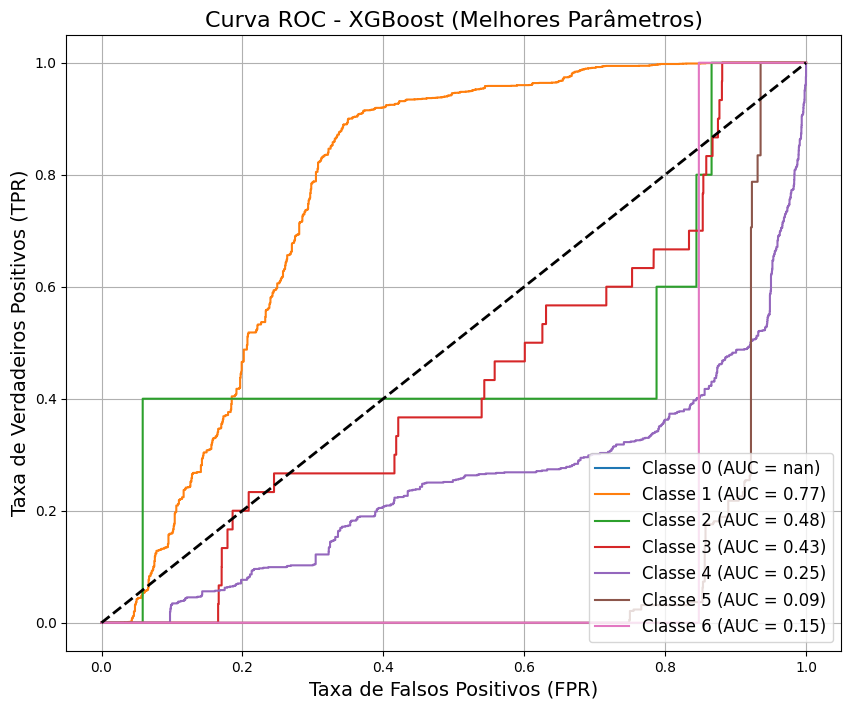

In [198]:
plot_roc_curve(xgb_best_model, X_test, y_test, model_name="XGBoost (Melhores Parâmetros)")

## 2.10. LightGBM

**Parametrização**

In [199]:
# Definindo o espaço de busca para os hiperparâmetros
lgbm_param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.1, 0.2],
    'num_leaves': [20, 30, 50],
    'subsample': [0.6, 0.8, 1.0]
}

# Número de combinações aleatórias a serem testadas
n_iter = 20
random_combinations = []
for _ in range(n_iter):
    params = {
        'n_estimators': random.choice(lgbm_param_grid['n_estimators']),
        'max_depth': random.choice(lgbm_param_grid['max_depth']),
        'learning_rate': random.choice(lgbm_param_grid['learning_rate']),
        'num_leaves': random.choice(lgbm_param_grid['num_leaves']),
        'subsample': random.choice(lgbm_param_grid['subsample']),
    }
    random_combinations.append(params)

# Configurando validação cruzada com 10 folds
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# Lista para armazenar os resultados
results = []

# Loop sobre as combinações aleatórias de parâmetros
for params in random_combinations:
    print(f"Treinando com parâmetros: {params}")
    fold_results = {'accuracy': [], 'recall': [], 'precision': [], 'f1': [], 'roc_auc': [],'acsa':[]}


    # Validação cruzada
    for train_index, test_index in kf.split(X_train):
        # Selecionando folds com base nos índices
        X_train_fold, X_test_fold = X_train.iloc[train_index], X_train.iloc[test_index]
        y_train_fold, y_test_fold = y_train.iloc[train_index], y_train.iloc[test_index]

        # Treinamento do modelo
        lgbm_model = LGBMClassifier(
            n_estimators=params['n_estimators'],
            max_depth=params['max_depth'],
            learning_rate=params['learning_rate'],
            num_leaves=params['num_leaves'],
            subsample=params['subsample'],
            random_state=42,
            class_weight='balanced',  # Atribui pesos inversamente proporcionais às frequências das classes
            min_child_samples=10,     # Número mínimo de amostras em um nó para dividir
            min_split_gain=0.01       # Ganho mínimo necessário para realizar um split
        )
        lgbm_model.fit(X_train_fold, y_train_fold)

        # Previsões e cálculo de métricas para cada fold
        y_pred_fold = lgbm_model.predict(X_test_fold)
        y_proba_fold = lgbm_model.predict_proba(X_test_fold)

        fold_results['accuracy'].append(accuracy_score(y_test_fold, y_pred_fold))
        fold_results['recall'].append(recall_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['precision'].append(precision_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['f1'].append(f1_score(y_test_fold, y_pred_fold, average='macro'))
        fold_results['roc_auc'].append(
            roc_auc_score(y_test_fold, y_proba_fold, multi_class='ovr')
        )
        fold_results['acsa'].append(get_acsa(y_test_fold,y_pred_fold))

    # Armazenando os resultados para a combinação atual
    results.append({
        'n_estimators': params['n_estimators'],
        'max_depth': params['max_depth'],
        'learning_rate': params['learning_rate'],
        'num_leaves': params['num_leaves'],
        'subsample': params['subsample'],
        'accuracy': np.mean(fold_results['accuracy']),
        'recall': np.mean(fold_results['recall']),
        'precision': np.mean(fold_results['precision']),
        'f1': np.mean(fold_results['f1']),
        'roc_auc': np.mean(fold_results['roc_auc']),
        'acsa': np.mean(fold_results['acsa'])
    })

# Convertendo os resultados em um DataFrame
results_lgbm = pd.DataFrame(results)

# Exibindo as 5 melhores combinações de parâmetros
print(results_lgbm.sort_values(by='accuracy', ascending=False).head(5))

Treinando com parâmetros: {'n_estimators': 200, 'max_depth': 7, 'learning_rate': 0.2, 'num_leaves': 50, 'subsample': 0.8}
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000612 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 539
[LightGBM] [Info] Number of data points in the train set: 6946, number of used features: 7
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Info] Start training from score -1.945910
[LightGBM] [Warning] No further splits with positive gain, best gain: 

In [200]:
results_lgbm.to_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_lgbm.csv', index= False)

**Resultados da modelagem**

In [201]:
metrics = ["precision", "accuracy", "recall", "f1", "roc_auc","acsa"]
best_row, rankings = rank_and_select_best(results_lgbm, metrics)
best_row

n_estimators     100.000000
max_depth          7.000000
learning_rate      0.200000
num_leaves        30.000000
subsample          0.600000
accuracy           0.992484
recall             0.992473
precision          0.992576
f1                 0.992466
roc_auc            0.999926
acsa               0.992473
mean_rank          1.000000
Name: 7, dtype: float64

**Melhor modelo**

In [202]:
best_n_estimators = int(best_row['n_estimators'])
best_max_depth = int(best_row['max_depth'])
best_learning_rate = float(best_row['learning_rate'])
best_num_leaves = int(best_row['num_leaves'])
best_subsample = float(best_row['subsample'])
best_lgbm_score = best_row['accuracy']

In [203]:
# Treinar o melhor modelo LightGBM
lgbm_best_model = LGBMClassifier(
    n_estimators=best_n_estimators,
    max_depth=best_max_depth,
    learning_rate=best_learning_rate,
    num_leaves=best_num_leaves,
    subsample=best_subsample
)

lgbm_best_model.fit(X_train, y_train)


start_time_lgbm= timeit.default_timer()
y_pred_lgbm = lgbm_best_model.predict(X_test)
infer_time_lgbm = timeit.default_timer() - start_time_lgbm
print(infer_time_lgbm)
# Fazer previsões
y_pred_proba_lgbm = lgbm_best_model.predict_proba(X_test)

# Avaliar o modelo
results_lgbm_metrics = {
    'accuracy': accuracy_score(y_test, y_pred_lgbm),
    'recall': recall_score(y_test, y_pred_lgbm, average='macro', zero_division=0),
    'precision': precision_score(y_test, y_pred_lgbm, average='macro', zero_division=0),
    'f1': f1_score(y_test, y_pred_lgbm, average='macro', zero_division=0),
    'roc_auc': roc_auc_score(y_test, y_pred_proba_lgbm, multi_class='ovr'),
    'acsa':get_acsa(y_test_XGBoost,y_pred_xgb)
}

print("Resultados das métricas do melhor modelo LightGBM:")
for metric, value in results_lgbm_metrics.items():
    print(f"{metric.capitalize()}: {value:.4f}")

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.010812 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 542
[LightGBM] [Info] Number of data points in the train set: 7718, number of used features: 7
[LightGBM] [Info] Start training from score -1.946429
[LightGBM] [Info] Start training from score -1.943710
[LightGBM] [Info] Start training from score -1.945522
[LightGBM] [Info] Start training from score -1.946429
[LightGBM] [Info] Start training from score -1.946429
[LightGBM] [Info] Start training from score -1.947336
[LightGBM] [Info] Start training from score -1.945522
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

**Curva ROC**

c:\Users\danin\AppData\Local\Programs\Python\Python311\Lib\site-packages\sklearn\metrics\_ranking.py:1133: UndefinedMetricWarning: No positive samples in y_true, true positive value should be meaningless
  warnings.warn(


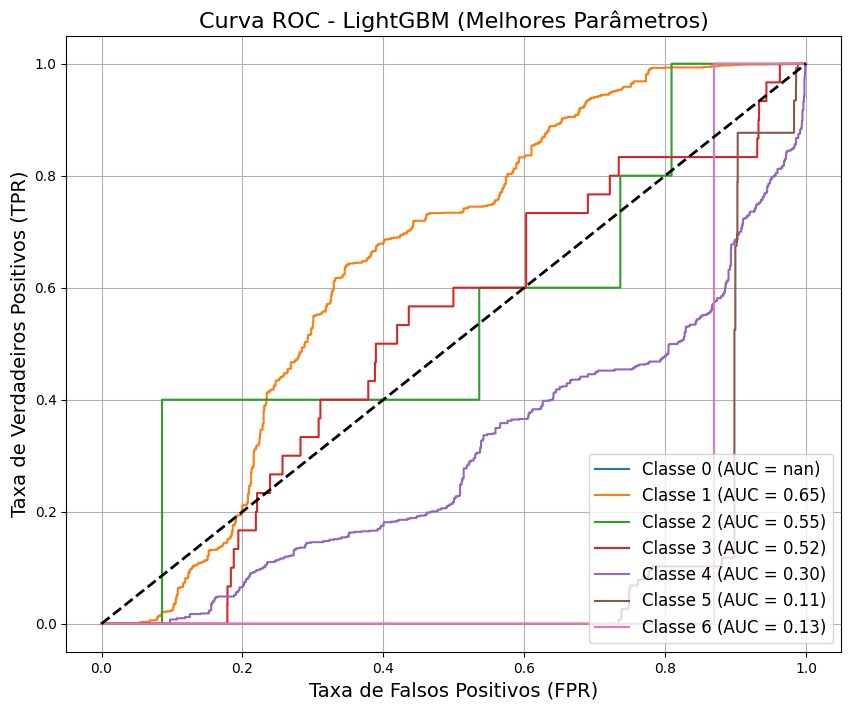

In [204]:
plot_roc_curve(lgbm_best_model, X_test, y_test, model_name="LightGBM (Melhores Parâmetros)")

# 3. Comparação dos resultados dos algoritmos

**Estrutura dos dados**

In [15]:
knn_df = pd.read_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_ok\results_knn.csv')
lqv_df = pd.read_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_ok\results_lqv.csv')
dt_df = pd.read_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_ok\results_dt.csv')
svm_df = pd.read_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_ok\results_svm.csv')
mlp_df = pd.read_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_ok\results_mlp.csv')
rf_df = pd.read_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_ok\results_rf.csv')
xgb_df = pd.read_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_ok\results_xgb.csv')
lgbm_df = pd.read_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_ok\results_lgbm.csv')
cmRn_df = pd.read_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_ok\results_comiteRN.csv')
cmHt_df = pd.read_csv(r'C:\Users\danin\Documents\lu\mestrado\projeto_final_leandro\results_ok\stacking_results.csv')



In [16]:
precision = {
    'knn': knn_df['precision'].tolist(),
    'dt': dt_df['precision'].tolist(),
    'svm': svm_df['precision'].tolist(),
    'lqv': lqv_df['precision'].tolist(),
    'mlp': mlp_df['precision'].tolist(),
    'rf' : rf_df['precision'].tolist(),
    'cmRn' : cmRn_df['precision'].tolist(),
    'cmHt' : cmHt_df['precision'].tolist(),
    'xgb' : xgb_df['precision'].tolist(),
    'lgbm' : lgbm_df['precision'].tolist()
}

accuracy = {
    'knn': knn_df['accuracy'].tolist(),
    'dt': dt_df['accuracy'].tolist(),
    'svm': svm_df['accuracy'].tolist(),
    'lqv': lqv_df['accuracy'].tolist(),
    'mlp': mlp_df['accuracy'].tolist(),
    'rf' : rf_df['accuracy'].tolist(),
    'cmRn' : cmRn_df['accuracy'].tolist(),
    'cmHt' : cmHt_df['accuracy'].tolist(),
    'xgb' : xgb_df['accuracy'].tolist(),
    'lgbm' : lgbm_df['accuracy'].tolist()
}

recall = {
    'knn': knn_df['recall'].tolist(),
    'dt': dt_df['recall'].tolist(),
    'svm': svm_df['recall'].tolist(),
    'lqv': lqv_df['recall'].tolist(),
    'mlp': mlp_df['recall'].tolist(),
    'rf' : rf_df['recall'].tolist(),
    'cmRn' : cmRn_df['recall'].tolist(),
    'cmHt' : cmHt_df['recall'].tolist(),
    'xgb' : xgb_df['recall'].tolist(),
    'lgbm' : lgbm_df['recall'].tolist()

}

f1 = {
    'knn': knn_df['f1'].tolist(),
    'dt': dt_df['f1'].tolist(),
    'svm': svm_df['f1'].tolist(),
    'lqv': lqv_df['f1'].tolist(),
    'mlp': mlp_df['f1'].tolist(),
    'rf' : rf_df['f1'].tolist(),
    'cmRn' : cmRn_df['f1'].tolist(),
    'cmHt' : cmHt_df['f1'].tolist(),
    'xgb' : xgb_df['f1'].tolist(),
    'lgbm' : lgbm_df['f1'].tolist()

}

roc_auc = {
    'knn': knn_df['roc_auc'].tolist(),
    'dt': dt_df['roc_auc'].tolist(),
    'svm': svm_df['roc_auc'].tolist(),
    'lqv': lqv_df['roc_auc'].tolist(),
    'mlp': mlp_df['roc_auc'].tolist(),
    'rf' : rf_df['roc_auc'].tolist(),
    'cmRn' : cmRn_df['roc_auc'].tolist(),
    'cmHt' : cmHt_df['roc_auc'].tolist(),
    'xgb' : xgb_df['roc_auc'].tolist(),
    'lgbm' : lgbm_df['roc_auc'].tolist()

}

acsa = {
    'knn': knn_df['acsa'].tolist(),
    'dt': dt_df['acsa'].tolist(),
    'svm': svm_df['acsa'].tolist(),
    'lqv': lqv_df['acsa'].tolist(),
    'mlp': mlp_df['acsa'].tolist(),
    'rf' : rf_df['acsa'].tolist(),
    'cmRn' : cmRn_df['acsa'].tolist(),
    'cmHt' : cmHt_df['acsa'].tolist(),
    'xgb' : xgb_df['acsa'].tolist(),
    'lgbm' : lgbm_df['acsa'].tolist()

}

## 3.1. Kolmogorov-Smirnov

In [17]:
multiIndex_columns = pd.MultiIndex.from_tuples([
    ('knn', 'statistic'), ('knn', 'pvalue'),
    ('dt', 'statistic'), ('dt', 'pvalue'),
    ('svm', 'statistic'), ('svm', 'pvalue'),
    ('lqv', 'statistic'), ('lqv', 'pvalue'),
    ('mlp', 'statistic'), ('mlp', 'pvalue'),
    ('rf', 'statistic'), ('rf', 'pvalue'),
    ('cmRn', 'statistic'), ('cmRn', 'pvalue'),
    ('cmHt', 'statistic'), ('cmHt', 'pvalue'),
    ('xgb', 'statistic'), ('xgb', 'pvalue'),
    ('lgbm', 'statistic'), ('lgbm', 'pvalue')
])
metrics_names = ['precision', 'accuracy', 'recall', 'f1', 'roc','acsa']

In [18]:
#Teste de normalidade
ks_df = pd.DataFrame(index = metrics_names , columns = multiIndex_columns)
pd.options.display.float_format = '{:.2e}'.format

for i, metric in zip(ks_df.index, [precision, accuracy, recall, f1, roc_auc,acsa]):
  for algorithm, distribution in metric.items():
    test_statistic = kstest(distribution, 'norm').statistic
    pvalue = kstest(distribution, 'norm').pvalue
    ks_df.loc[i, (algorithm, 'statistic')] = test_statistic
    ks_df.loc[i, (algorithm, 'pvalue')] = np.format_float_scientific(pvalue, precision=10)

In [19]:
pd.set_option('display.max_columns', None)


In [20]:
# Finalizar e exibir os resultados
print("Resultados dos Testes de Normalidade (Kolmogorov-Smirnov):")
print(ks_df)


Resultados dos Testes de Normalidade (Kolmogorov-Smirnov):
                knn                          dt                         svm  \
          statistic            pvalue statistic            pvalue statistic   
precision  8.22e-01  2.3047366141e-15  7.33e-01  1.5948502069e-11  5.14e-01   
accuracy   8.22e-01  2.4859865217e-15  7.33e-01  1.6547122047e-11  5.54e-01   
recall     8.22e-01  2.4861208848e-15  7.33e-01  1.6522057605e-11  5.61e-01   
f1         8.21e-01  2.6314330703e-15  7.33e-01  1.6579048224e-11  5.17e-01   
roc        8.40e-01  2.5020306185e-16  8.00e-01  2.8609694861e-14  6.77e-01   
acsa       8.22e-01  2.4861208848e-15  7.33e-01  1.6522057605e-11  5.61e-01   

                                  lqv                         mlp  \
                     pvalue statistic            pvalue statistic   
precision  1.9762903171e-05  5.32e-01  8.1903816305e-06  7.43e-01   
accuracy   2.6011538273e-06  5.75e-01  8.4446131954e-07  7.47e-01   
recall     1.8293255713e-06  5.7

In [21]:
ks_df.to_csv(r'ks.csv')

In [22]:
ks_df.columns

MultiIndex([( 'knn', 'statistic'),
            ( 'knn',    'pvalue'),
            (  'dt', 'statistic'),
            (  'dt',    'pvalue'),
            ( 'svm', 'statistic'),
            ( 'svm',    'pvalue'),
            ( 'lqv', 'statistic'),
            ( 'lqv',    'pvalue'),
            ( 'mlp', 'statistic'),
            ( 'mlp',    'pvalue'),
            (  'rf', 'statistic'),
            (  'rf',    'pvalue'),
            ('cmRn', 'statistic'),
            ('cmRn',    'pvalue'),
            ('cmHt', 'statistic'),
            ('cmHt',    'pvalue'),
            ( 'xgb', 'statistic'),
            ( 'xgb',    'pvalue'),
            ('lgbm', 'statistic'),
            ('lgbm',    'pvalue')],
           )

## 3.2. Friedmann

In [23]:
def friedman_test_for_dataframe(metric_data):
    # Executar o teste de Friedman
    statistic, p_value = friedmanchisquare(*metric_data.values())

    # Criar o DataFrame com a estatística e o p-valor
    result = pd.DataFrame({
        'statistic': [statistic],
        'p_value': [p_value]
    })
    return result

In [ ]:
friedman_acuracy = friedman_test_for_dataframe(accuracy)
friedman_precision = friedman_test_for_dataframe(precision)
friedman_recall = friedman_test_for_dataframe(recall)
friedman_f1 = friedman_test_for_dataframe(f1)
friedman_roc_auc = friedman_test_for_dataframe(roc_auc)
friedman_acsa = friedman_test_for_dataframe(acsa)

       

In [ ]:
print(friedman_acuracy)
print(friedman_precision)
print(friedman_recall)
print(friedman_f1)
print(friedman_roc_auc)
print(friedman_acsa)

   statistic  p_value
0   1.29e+02 1.52e-23
   statistic  p_value
0   1.29e+02 1.91e-23
   statistic  p_value
0   1.30e+02 1.27e-23
   statistic  p_value
0   1.29e+02 1.93e-23
   statistic  p_value
0   1.40e+02 1.12e-25


## 3.3. Nemenyi

In [26]:
import numpy as np
import pandas as pd
from scipy.stats import rankdata, distributions
from math import sqrt

def calculate_ranks(data):
    """
    Calcula os rankings para cada observação em um conjunto de dados.
    Os valores maiores recebem ranks menores (inversão para considerar maior = melhor).
    """
    return np.array([rankdata(-row) for row in data])  # Maior é melhor

def critical_value_tukey_manual(k, alpha=0.05):
    """
    Retorna o valor crítico aproximado de Tukey para k grupos,
    assumindo distribuições padrão e graus de liberdade elevados.
    """
    q_alpha = distributions.studentized_range.ppf(1 - alpha, k, 1e6)  # Aproximação para grande n
    return q_alpha

def nemenyi_posthoc(metric_dict, alpha=0.05):
    # Convertendo o dicionário em matriz numpy e extraindo informações
    algorithms = list(metric_dict.keys())
    data = np.array([metric_dict[algo] for algo in algorithms]).T
    n, k = data.shape  # Número de observações (n) e algoritmos (k)

    # Calcula os rankings
    ranks = calculate_ranks(data)

    # Média das classificações por algoritmo
    mean_ranks = ranks.mean(axis=0)

    # Valor crítico para o teste de Nemenyi (diferença mínima significativa)
    q_critical = critical_value_tukey_manual(k, alpha)
    cd = q_critical * sqrt(k * (k + 1) / (6 * n))

    # Comparações pareadas entre algoritmos
    result_matrix = pd.DataFrame(
        np.zeros((k, k)), columns=algorithms, index=algorithms
    )

    for i in range(k):
        for j in range(k):
            if i != j:
                diff = abs(mean_ranks[i] - mean_ranks[j])
                result_matrix.iloc[i, j] = diff #if diff > cd else 0

    return result_matrix, q_critical

**Acsa**

In [ ]:

acsa_df, critic_value = nemenyi_posthoc(acsa)
print(critic_value)
acsa_df

**Precisão**

In [27]:
precision_df, critic_value = nemenyi_posthoc(precision)
print(critic_value)
precision_df

4.4741242217259005


,knn,dt,svm,lqv,mlp,rf,cmRn,cmHt,xgb,lgbm
knn,0.00e+00,1.40e+00,2.55e+00,3.20e+00,8.00e-01,3.20e+00,3.00e-01,4.40e+00,2.25e+00,3.50e+00
dt,1.40e+00,0.00e+00,3.95e+00,4.60e+00,2.20e+00,1.80e+00,1.10e+00,3.00e+00,8.50e-01,2.10e+00
svm,2.55e+00,3.95e+00,0.00e+00,6.50e-01,1.75e+00,5.75e+00,2.85e+00,6.95e+00,4.80e+00,6.05e+00
lqv,3.20e+00,4.60e+00,6.50e-01,0.00e+00,2.40e+00,6.40e+00,3.50e+00,7.60e+00,5.45e+00,6.70e+00
mlp,8.00e-01,2.20e+00,1.75e+00,2.40e+00,0.00e+00,4.00e+00,1.10e+00,5.20e+00,3.05e+00,4.30e+00
rf,3.20e+00,1.80e+00,5.75e+00,6.40e+00,4.00e+00,0.00e+00,2.90e+00,1.20e+00,9.50e-01,3.00e-01
cmRn,3.00e-01,1.10e+00,2.85e+00,3.50e+00,1.10e+00,2.90e+00,0.00e+00,4.10e+00,1.95e+00,3.20e+00
cmHt,4.40e+00,3.00e+00,6.95e+00,7.60e+00,5.20e+00,1.20e+00,4.10e+00,0.00e+00,2.15e+00,9.00e-01
xgb,2.25e+00,8.50e-01,4.80e+00,5.45e+00,3.05e+00,9.50e-01,1.95e+00,2.15e+00,0.00e+00,1.25e+00
lgbm,3.50e+00,2.10e+00,6.05e+00,6.70e+00,4.30e+00,3.00e-01,3.20e+00,9.00e-01,1.25e+00,0.00e+00


**Accuracy**

In [28]:
accuracy_df, critic_value = nemenyi_posthoc(accuracy)
print(critic_value)
accuracy_df

4.4741242217259005


,knn,dt,svm,lqv,mlp,rf,cmRn,cmHt,xgb,lgbm
knn,0.00e+00,1.50e+00,2.50e+00,3.25e+00,8.50e-01,3.20e+00,3.00e-01,4.40e+00,2.20e+00,3.50e+00
dt,1.50e+00,0.00e+00,4.00e+00,4.75e+00,2.35e+00,1.70e+00,1.20e+00,2.90e+00,7.00e-01,2.00e+00
svm,2.50e+00,4.00e+00,0.00e+00,7.50e-01,1.65e+00,5.70e+00,2.80e+00,6.90e+00,4.70e+00,6.00e+00
lqv,3.25e+00,4.75e+00,7.50e-01,0.00e+00,2.40e+00,6.45e+00,3.55e+00,7.65e+00,5.45e+00,6.75e+00
mlp,8.50e-01,2.35e+00,1.65e+00,2.40e+00,0.00e+00,4.05e+00,1.15e+00,5.25e+00,3.05e+00,4.35e+00
rf,3.20e+00,1.70e+00,5.70e+00,6.45e+00,4.05e+00,0.00e+00,2.90e+00,1.20e+00,1.00e+00,3.00e-01
cmRn,3.00e-01,1.20e+00,2.80e+00,3.55e+00,1.15e+00,2.90e+00,0.00e+00,4.10e+00,1.90e+00,3.20e+00
cmHt,4.40e+00,2.90e+00,6.90e+00,7.65e+00,5.25e+00,1.20e+00,4.10e+00,0.00e+00,2.20e+00,9.00e-01
xgb,2.20e+00,7.00e-01,4.70e+00,5.45e+00,3.05e+00,1.00e+00,1.90e+00,2.20e+00,0.00e+00,1.30e+00
lgbm,3.50e+00,2.00e+00,6.00e+00,6.75e+00,4.35e+00,3.00e-01,3.20e+00,9.00e-01,1.30e+00,0.00e+00


**Recall**

In [29]:
recall_df, critic_value = nemenyi_posthoc(recall)
print(critic_value)
recall_df

4.4741242217259005


,knn,dt,svm,lqv,mlp,rf,cmRn,cmHt,xgb,lgbm
knn,0.00e+00,1.45e+00,2.50e+00,3.25e+00,8.50e-01,3.25e+00,3.00e-01,4.40e+00,2.20e+00,3.50e+00
dt,1.45e+00,0.00e+00,3.95e+00,4.70e+00,2.30e+00,1.80e+00,1.15e+00,2.95e+00,7.50e-01,2.05e+00
svm,2.50e+00,3.95e+00,0.00e+00,7.50e-01,1.65e+00,5.75e+00,2.80e+00,6.90e+00,4.70e+00,6.00e+00
lqv,3.25e+00,4.70e+00,7.50e-01,0.00e+00,2.40e+00,6.50e+00,3.55e+00,7.65e+00,5.45e+00,6.75e+00
mlp,8.50e-01,2.30e+00,1.65e+00,2.40e+00,0.00e+00,4.10e+00,1.15e+00,5.25e+00,3.05e+00,4.35e+00
rf,3.25e+00,1.80e+00,5.75e+00,6.50e+00,4.10e+00,0.00e+00,2.95e+00,1.15e+00,1.05e+00,2.50e-01
cmRn,3.00e-01,1.15e+00,2.80e+00,3.55e+00,1.15e+00,2.95e+00,0.00e+00,4.10e+00,1.90e+00,3.20e+00
cmHt,4.40e+00,2.95e+00,6.90e+00,7.65e+00,5.25e+00,1.15e+00,4.10e+00,0.00e+00,2.20e+00,9.00e-01
xgb,2.20e+00,7.50e-01,4.70e+00,5.45e+00,3.05e+00,1.05e+00,1.90e+00,2.20e+00,0.00e+00,1.30e+00
lgbm,3.50e+00,2.05e+00,6.00e+00,6.75e+00,4.35e+00,2.50e-01,3.20e+00,9.00e-01,1.30e+00,0.00e+00


**F1 score**

In [30]:
f1_df, critic_value = nemenyi_posthoc(f1)
print(critic_value)
f1_df

4.4741242217259005


,knn,dt,svm,lqv,mlp,rf,cmRn,cmHt,xgb,lgbm
knn,0.00e+00,1.45e+00,2.50e+00,3.25e+00,8.00e-01,3.20e+00,3.00e-01,4.40e+00,2.20e+00,3.50e+00
dt,1.45e+00,0.00e+00,3.95e+00,4.70e+00,2.25e+00,1.75e+00,1.15e+00,2.95e+00,7.50e-01,2.05e+00
svm,2.50e+00,3.95e+00,0.00e+00,7.50e-01,1.70e+00,5.70e+00,2.80e+00,6.90e+00,4.70e+00,6.00e+00
lqv,3.25e+00,4.70e+00,7.50e-01,0.00e+00,2.45e+00,6.45e+00,3.55e+00,7.65e+00,5.45e+00,6.75e+00
mlp,8.00e-01,2.25e+00,1.70e+00,2.45e+00,0.00e+00,4.00e+00,1.10e+00,5.20e+00,3.00e+00,4.30e+00
rf,3.20e+00,1.75e+00,5.70e+00,6.45e+00,4.00e+00,0.00e+00,2.90e+00,1.20e+00,1.00e+00,3.00e-01
cmRn,3.00e-01,1.15e+00,2.80e+00,3.55e+00,1.10e+00,2.90e+00,0.00e+00,4.10e+00,1.90e+00,3.20e+00
cmHt,4.40e+00,2.95e+00,6.90e+00,7.65e+00,5.20e+00,1.20e+00,4.10e+00,0.00e+00,2.20e+00,9.00e-01
xgb,2.20e+00,7.50e-01,4.70e+00,5.45e+00,3.00e+00,1.00e+00,1.90e+00,2.20e+00,0.00e+00,1.30e+00
lgbm,3.50e+00,2.05e+00,6.00e+00,6.75e+00,4.30e+00,3.00e-01,3.20e+00,9.00e-01,1.30e+00,0.00e+00


**Roc AUC**

In [31]:
roc_auc_df, critic_value = nemenyi_posthoc(roc_auc)
print(critic_value)
roc_auc_df

4.4741242217259005


,knn,dt,svm,lqv,mlp,rf,cmRn,cmHt,xgb,lgbm
knn,0.00e+00,1.05e+00,2.35e+00,3.30e+00,4.50e+00,1.65e+00,5.00e-02,2.70e+00,2.90e+00,4.00e+00
dt,1.05e+00,0.00e+00,1.30e+00,2.25e+00,5.55e+00,2.70e+00,1.00e+00,3.75e+00,3.95e+00,5.05e+00
svm,2.35e+00,1.30e+00,0.00e+00,9.50e-01,6.85e+00,4.00e+00,2.30e+00,5.05e+00,5.25e+00,6.35e+00
lqv,3.30e+00,2.25e+00,9.50e-01,0.00e+00,7.80e+00,4.95e+00,3.25e+00,6.00e+00,6.20e+00,7.30e+00
mlp,4.50e+00,5.55e+00,6.85e+00,7.80e+00,0.00e+00,2.85e+00,4.55e+00,1.80e+00,1.60e+00,5.00e-01
rf,1.65e+00,2.70e+00,4.00e+00,4.95e+00,2.85e+00,0.00e+00,1.70e+00,1.05e+00,1.25e+00,2.35e+00
cmRn,5.00e-02,1.00e+00,2.30e+00,3.25e+00,4.55e+00,1.70e+00,0.00e+00,2.75e+00,2.95e+00,4.05e+00
cmHt,2.70e+00,3.75e+00,5.05e+00,6.00e+00,1.80e+00,1.05e+00,2.75e+00,0.00e+00,2.00e-01,1.30e+00
xgb,2.90e+00,3.95e+00,5.25e+00,6.20e+00,1.60e+00,1.25e+00,2.95e+00,2.00e-01,0.00e+00,1.10e+00
lgbm,4.00e+00,5.05e+00,6.35e+00,7.30e+00,5.00e-01,2.35e+00,4.05e+00,1.30e+00,1.10e+00,0.00e+00


# 4. Melhor Modelo

In [222]:
import pandas as pd

def calculate_model_ranking(models, models_name):

    # Criar um DataFrame a partir dos resultados
    df_metrics = pd.DataFrame(models)

    # Calcular o ranking para cada métrica
    rankings = df_metrics.rank(ascending=False, method="min")

    # Calcular a média dos rankings por modelo
    rankings['average_rank'] = rankings.mean(axis=1)

    # Criar um DataFrame com as médias de ranking
    average_ranking = pd.DataFrame(
        [rankings['average_rank'].values],
        columns=[model for model in models_name]
    )

    return average_ranking

In [223]:
models = [results_knn, results_lqv_best, results_dt, results_svm_best, results_rf_best,
          results_mlp_best, results_ensemble_best, cmHt_best, results_xgb_metrics, results_lgbm_metrics]
models_name = ['knn', 'lqv', 'dt', 'svm', 'rf', 'mlp', 'cmRn', 'cmHt', 'xgb', 'lgbm']

calculate_model_ranking(models, models_name)

,knn,lqv,dt,svm,rf,mlp,cmRn,cmHt,xgb,lgbm
0,8.50e+00,9.00e+00,6.83e+00,7.00e+00,4.83e+00,3.50e+00,3.67e+00,2.00e+00,2.33e+00,2.50e+00


### cálculo de uso de tempo de memória

In [ ]:
from sklearn.base import clone
# Definindo os 10 modelos
models = {
    "K-NN": KNeighborsClassifier(n_neighbors=3),
    "LVQ": None,  # LVQ não é implementado diretamente no scikit-learn, usar biblioteca apropriada como `sklearn_lvq`
    "Árvore de Decisão": DecisionTreeClassifier(),
    "SVM": SVC(),
    "Random Forest": RandomForestClassifier(n_estimators=50),
    "MLP": MLPClassifier(hidden_layer_sizes=(100,)),
    "Comitê de Redes Neurais Artificiais": None,  # Você precisaria de uma implementação específica de comitê de redes neurais
    "Stacking": StackingClassifier(estimators=[
        ('rf', RandomForestClassifier(n_estimators=50)),
        ('knn', KNeighborsClassifier(n_neighbors=5))
    ], final_estimator=LogisticRegression()),
    "XGBoost": XGBClassifier(),
    "LightGBM": LGBMClassifier()
}
# Função para medir o uso de memória
def measure_memory(model_name, model):
    mem_usage_train = memory_usage((model.fit, (X_train, y_train)))
    mem_usage_infer = memory_usage((model.fit(X_train, y_train).predict, (X_test,)))

    print(f"Modelo: {model_name}")
    print(f"Memória usada durante o treinamento: {max(mem_usage_train) - min(mem_usage_train):.4f} MiB")
    print(f"Memória usada durante a inferência: {max(mem_usage_infer) - min(mem_usage_infer):.4f} MiB")

# Medindo o uso de memória para cada modelo
for model_name, model in models.items():
    if model is not None:  # Ignora modelos que não têm implementação direta aqui
        measure_memory(model_name, clone(model))  # Usando `clone` para garantir que o modelo é treinado do zero